In [1]:
import SciServer.CasJobs as CasJobs # query with CasJobs
import SciServer.SciDrive           # read/write to/from SciDrive

In [2]:
from pymongo import MongoClient
from bson.son import SON
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import astropy.io.fits as astrofits
from astropy.table import Table
import scipy
from scipy import interpolate
import pickle
import skimage.io 
import urllib3
import io
import gc # needed because the pandas plotting routines open too many files and cause crashes (maybe also mongo)
%matplotlib inline
#plt.rc('text', usetex=True)
#%matplotlib notebook

In [3]:
clientInstance = MongoClient()
database = clientInstance['test']
gzClassifications = database['galaxy_zoo_classifications']
gzSubjects = database['galaxy_zoo_subjects']
gzGroups = database['galaxy_zoo_groups']

In [4]:
# Switch and path to enable serialization of Illustris Halo data for GZ subjects that are retrieved from the Illustris 
# web service
saveIllustrisHaloData = False
pickleDataPath = '/Users/hughdickinson/Documents/Development/Sloan-Illustris-Comparison/data/IllustrisHaloData.pkl'
pickleMetaDataPath = '/Users/hughdickinson/Documents/Development/Sloan-Illustris-Comparison/data/IllustrisHaloMetaData.pkl'
saveSDSSData = False
pickleSDSSDataPath = '/Users/hughdickinson/Documents/Development/Sloan-Illustris-Comparison/data/SDSSZooniverseData.pkl'
saveIllustrisZooData = False
pickleIllustrisDataPath = '/Users/hughdickinson/Documents/Development/Sloan-Illustris-Comparison/data/IllustrisZooniverseData.pkl'

In [5]:
verbose = True
if verbose :
    import pprint
    from IPython.core.display import display
    prettyPrinter = pprint.PrettyPrinter(indent=4)

### Retrieve the `name` field of all documents in the `galaxy_zoo_groups` collection

In [6]:
gzGroupNames = pd.DataFrame([found for found in gzGroups.find({},{"name": 1, "_id": 0})])
if verbose :
    display(gzGroupNames)

,name
0,candels
1,sloan
2,candels_2epoch
3,ferengi
4,goods_full
5,illustris
6,sloan_singleband
7,decals
8,ukidss
9,sdss_lost_set


### Retrieve data pertaining to all subjects provided by the SDSS that were classified in GalaxyZoo

In [7]:
galaxyPropertiesSloan = gzSubjects.find({"$or" : [{"metadata.survey": "sloan"}, 
                                         {"metadata.survey": "sloan_singleband"},
                                         {"metadata.survey": "sdss_lost_set"}]})

In [8]:
galaxyPropertiesSloan.rewind()
galaxyPropertiesSloanFrame = pd.DataFrame([found for found in galaxyPropertiesSloan])

In [9]:
display(galaxyPropertiesSloanFrame)

,_id,activated_at,classification_count,coords,created_at,group,group_id,location,metadata,project_id,random,state,updated_at,workflow_ids,zooniverse_id
0,504e468dc499611ea600cb6a,2014-10-09 21:00:26.318,60,"[51.4835835170095, 1.27201267477703]",2012-09-10 19:59:09.165,NaN,50251c3b516bcb6ecb000002,{'inverted': 'http://www.galaxyzoo.org.s3.amaz...,"{'retire_at': 60, 'petrorad_flux': 188.132965,...",502a90cd516bcb060c000001,0.755644,complete,2013-10-06 16:16:50.281,[50251c3b516bcb6ecb000002],AGZ000146i
1,504e468dc499611ea600cb6b,2015-02-13 20:48:41.744,58,"[60.5488829338603, -1.11400991358055]",2012-09-10 19:59:09.516,NaN,50251c3b516bcb6ecb000002,{'inverted': 'http://www.galaxyzoo.org.s3.amaz...,"{'retire_at': 40, 'petrorad_flux': 226.259079,...",502a90cd516bcb060c000001,0.812113,complete,2013-11-26 03:24:51.769,[50251c3b516bcb6ecb000002],AGZ000146j
2,504e468dc499611ea600cb6c,2014-05-08 19:01:30.210,40,"[60.6674021412589, -1.20799192116951]",2012-09-10 19:59:09.560,NaN,50251c3b516bcb6ecb000002,{'inverted': 'http://www.galaxyzoo.org.s3.amaz...,"{'petrorad_flux': 151.406189, 'survey': 'sloan...",502a90cd516bcb060c000001,0.193650,complete,2012-09-10 19:59:09.562,[50251c3b516bcb6ecb000002],AGZ000146k
3,504e468dc499611ea600cb6e,2014-08-04 16:33:56.953,60,"[61.0905528046856, -1.08403006921333]",2012-09-10 19:59:09.632,NaN,50251c3b516bcb6ecb000002,{'inverted': 'http://www.galaxyzoo.org.s3.amaz...,"{'retire_at': 60, 'petrorad_flux': 100.924454,...",502a90cd516bcb060c000001,0.873236,complete,2012-09-10 19:59:09.633,[50251c3b516bcb6ecb000002],AGZ000146m
4,504e468dc499611ea600cb6d,2015-02-13 20:48:41.799,60,"[60.8633736254627, -1.17767404602372]",2012-09-10 19:59:09.594,NaN,50251c3b516bcb6ecb000002,{'inverted': 'http://www.galaxyzoo.org.s3.amaz...,"{'retire_at': 60, 'petrorad_flux': 368.290436,...",502a90cd516bcb060c000001,0.293149,complete,2013-07-20 03:26:59.242,[50251c3b516bcb6ecb000002],AGZ000146l
5,504e468dc499611ea600cb6f,2015-02-13 20:48:41.816,48,"[61.2007746457534, -1.13736489924484]",2012-09-10 19:59:09.682,NaN,50251c3b516bcb6ecb000002,{'inverted': 'http://www.galaxyzoo.org.s3.amaz...,"{'retire_at': 40, 'petrorad_flux': 100.328865,...",502a90cd516bcb060c000001,0.779216,complete,2012-09-10 19:59:09.687,[50251c3b516bcb6ecb000002],AGZ000146n
6,504e468dc499611ea600cb73,2015-02-13 20:48:41.863,56,"[61.8569302167542, -1.07365581599838]",2012-09-10 19:59:09.808,NaN,50251c3b516bcb6ecb000002,{'inverted': 'http://www.galaxyzoo.org.s3.amaz...,"{'retire_at': 40, 'petrorad_flux': 123.47126, ...",502a90cd516bcb060c000001,0.044974,complete,2012-09-10 19:59:09.810,[50251c3b516bcb6ecb000002],AGZ000146r
7,504e468dc499611ea600cb76,2015-02-13 20:48:41.879,58,"[62.4253534105153, -1.18599729266551]",2012-09-10 19:59:09.923,NaN,50251c3b516bcb6ecb000002,{'inverted': 'http://www.galaxyzoo.org.s3.amaz...,"{'retire_at': 40, 'petrorad_flux': 291.75824, ...",502a90cd516bcb060c000001,0.407192,complete,2012-09-10 19:59:09.925,[50251c3b516bcb6ecb000002],AGZ000146u
8,504e468dc499611ea600cb72,2015-02-13 20:48:41.848,45,"[61.7886596522992, -1.08900729764444]",2012-09-10 19:59:09.776,NaN,50251c3b516bcb6ecb000002,{'inverted': 'http://www.galaxyzoo.org.s3.amaz...,"{'retire_at': 40, 'petrorad_flux': 118.985512,...",502a90cd516bcb060c000001,0.644164,complete,2012-09-10 19:59:09.778,[50251c3b516bcb6ecb000002],AGZ000146q
9,504e468dc499611ea600cb74,2014-08-04 15:18:05.615,60,"[62.0988376958089, -1.07587229096729]",2012-09-10 19:59:09.836,NaN,50251c3b516bcb6ecb000002,{'inverted': 'http://www.galaxyzoo.org.s3.amaz...,"{'retire_at': 60, 'petrorad_flux': 1294.58618,...",502a90cd516bcb060c000001,0.912023,complete,2014-09-29 15:39:16.449,[50251c3b516bcb6ecb000002],AGZ000146s


### Retrieve selected metadata properties for GalaxyZoo subjects in the `Illustris` subject group

This is an updated query that also retrieves the classifications for each of the **completed** Illustris subjects. **This query takes a long time so serialization of a subsequently synthesized `pandas.DataFrame` and reading the data from that file thereafter is recommended**.

In [10]:
if saveIllustrisZooData :
    galaxyPropertiesIllustrisPipeline = [{"$match" :
                                          {"$and" : [ {"metadata.survey" : "illustris"}, 
                                                     {"state" : "complete"}
                                                    ] } 
                                         },
                                         {"$lookup" : {"from" : "galaxy_zoo_classifications", 
                                                       "localField" : "_id", 
                                                       "foreignField" : "subject_ids",
                                                       "as": "classifications" }
                                         },
                                         {"$project" : {"classifications.annotations": 1,
                                                        "zooniverse_id" : 1,
                                                        "classification_count" : 1,
                                                        "metadata" : 1 } 
                                                      } 
                                        ]

    galaxyPropertiesIllustrisList = list(gzSubjects.aggregate(galaxyPropertiesIllustrisPipeline, allowDiskUse=True, batchSize=1000))

In [11]:
if saveIllustrisZooData :
    prettyPrinter.pprint(galaxyPropertiesIllustrisList[0])

Save the results to memory - the API only allows the data to be retrieved from the server once!

### Aside: The GalaxyZoo Illustris dataset
The **initial** set of illustris images that **have been** classified by GalaxyZoo volunteers is described [here](https://github.com/willettk/illustris/blob/master/analysis/illustris_gz_analysis.pdf).

There are two distict datasets that can be distinguished by the `metadata.priority` field for all images in the Illustris dataset listed in the `galaxy_zoo_subjects` collection of the mongo database.

The values for the `metadata.priority` field and their interpretation are:

 - `fixed_mass`: (10,832 galaxies) - This subset includes images for all camera angles and backgrounds within two narrow mass ranges (low and high). This is for analyzing the effect of viewing angle and background on morphological accuracy.
 - `fixed_view`: (6,214 galaxies) - This subset spans the full mass range of the sample, but with only 1~camera angle and background per galaxy. This is for doing an initial survey of the morphological distributions.

### Mutate the retrieved data and store in a `pandas.DataFrame` structure
First transform the answer annotations for each subject into a `dict` of `list`s for each answer.

In [12]:
if saveIllustrisZooData :
    allSubjectAnswers = {}
    for found in galaxyPropertiesIllustrisList :
        subjectAnswers = {}
        for annotations in found['classifications'] :
            for answer in annotations['annotations'] :
                questionKey = str(list(answer)[0])
                answerKey = str(answer[questionKey])
                if 'illustris' not in questionKey :
                    continue
                if questionKey in subjectAnswers :
                    if answerKey in subjectAnswers[questionKey] :
                        subjectAnswers[questionKey][answerKey] += 1
                    else :
                        subjectAnswers[questionKey].update({answerKey : 1})
                else :
                    subjectAnswers.update({questionKey : {answerKey : 1}})
        allSubjectAnswers.update({found["metadata"]["subhalo_id"]: subjectAnswers})            
    prettyPrinter.pprint(allSubjectAnswers)

Now extract just the `illustris-0` question i.e. *Smooth* `a-0`, *featured* `a-1` or *artifact* `a-2`.

In [13]:
if saveIllustrisZooData :
    voteFractionsIllustrisFrame = pd.DataFrame([(key, 
                                                 value['illustris-0']['a-0'] if 'a-0' in value['illustris-0'] else 0, 
                                                 value['illustris-0']['a-1'] if 'a-1' in value['illustris-0'] else 0, 
                                                 value['illustris-0']['a-2'] if 'a-2' in value['illustris-0'] else 0,
                                                 value['illustris-1']['a-0'] if ('illustris-1' in value and 'a-0' in value['illustris-1']) else 0,
                                                 value['illustris-1']['a-1'] if ('illustris-1' in value and 'a-1' in value['illustris-1']) else 0
                                                ) 
                                                for key, value in allSubjectAnswers.items()], 
                                               columns=['subhalo_id', 'num_smooth', 'num_features', 'num_artifact', 'num_edgeon', 'num_faceon'])
    voteFractionsIllustrisFrame = voteFractionsIllustrisFrame.set_index('subhalo_id')
    voteFractionsIllustrisFrame = voteFractionsIllustrisFrame.sort_index()
    voteFractionsIllustrisFrame['p_smooth'] = voteFractionsIllustrisFrame['num_smooth']/(voteFractionsIllustrisFrame['num_smooth'] + voteFractionsIllustrisFrame['num_features'])
    voteFractionsIllustrisFrame['p_features'] = voteFractionsIllustrisFrame['num_features']/(voteFractionsIllustrisFrame['num_smooth'] + voteFractionsIllustrisFrame['num_features'])
    # Add computed columns for "edge on" versus "not edge on"
    pFeaturesThreshold = 0.6
    voteFractionsIllustrisFrame['is_edge_on'] = np.logical_and(voteFractionsIllustrisFrame['num_edgeon'] >= voteFractionsIllustrisFrame['num_faceon'], voteFractionsIllustrisFrame['num_edgeon'] !=0)
    voteFractionsIllustrisFrame['is_features_and_edge_on'] = np.logical_and(voteFractionsIllustrisFrame['is_edge_on'], voteFractionsIllustrisFrame['p_features'] > pFeaturesThreshold)
    display (voteFractionsIllustrisFrame)

In [14]:
if saveIllustrisZooData :
    voteFractionsIllustrisFrame = voteFractionsIllustrisFrame.sort_index()

In [15]:
if saveIllustrisZooData :
    galaxyPropertiesIllustrisFrame = pd.DataFrame([ (
                found["metadata"]["subhalo_id"],
                found["metadata"]["priority"],
                found["metadata"]["mass_log_msun"],
                np.log10(found["metadata"]["radius_half"]),
                np.log10(found["metadata"]["sfr"]) if found["metadata"]["sfr"] != 0 else 0.0,
                float(found["metadata"]["mag"]["absmag_r"]),
                float(found["metadata"]["mag"]["absmag_b"]),
                float(found["metadata"]["mag"]["absmag_g"]),
                float(found["metadata"]["mag"]["absmag_i"]),
                float(found["metadata"]["mag"]["absmag_k"]),
                float(found["metadata"]["mag"]["absmag_u"]),
                float(found["metadata"]["mag"]["absmag_v"]),
                float(found["metadata"]["mag"]["absmag_z"])
            ) for found in galaxyPropertiesIllustrisList],
                                                  columns=["subhalo_id",
                                                           "priority",
                                                           "mass_log_msun", 
                                                           "log_radius_half",
                                                           "log_sfr",
                                                           "absmag_r",
                                                           "absmag_b",
                                                           "absmag_g",
                                                           "absmag_i",
                                                           "absmag_k",
                                                           "absmag_u",
                                                           "absmag_v",
                                                           "absmag_z"]
                                                 )

### Perform aggregation operations on the extracted data

Index the `pandas.DataFrame` structure based on the `subhalo_id` metadatum.

In [16]:
if saveIllustrisZooData :
    galaxyPropertiesIllustrisFrame = galaxyPropertiesIllustrisFrame.set_index("subhalo_id")

The GalaxyZoo dataset includes multiple views of the same sub-halo superimposed on different backgrounds. Remove duplicate sub-halos by grouping the data and assigning the mean of associated numerical values to each grouped datum.

In [17]:
if verbose and saveIllustrisZooData:
    display(galaxyPropertiesIllustrisFrame)

### Merge vote fractions with physical properties 

In [18]:
if saveIllustrisZooData :
    galaxyPropertiesAndVotesIllustrisFrame = galaxyPropertiesIllustrisFrame.merge(voteFractionsIllustrisFrame, left_index=True, right_index=True, how='left')

### Serialize the data extracted from the GalaxyZoo classification database or load it as required
This saves time on database queries and data organization.

In [19]:
if saveIllustrisZooData :
    galaxyPropertiesAndVotesIllustrisFrame.to_pickle(pickleIllustrisDataPath)
else :
    galaxyPropertiesAndVotesIllustrisFile = open(pickleIllustrisDataPath, 'rb')
    galaxyPropertiesAndVotesIllustrisFrame = pickle.load(galaxyPropertiesAndVotesIllustrisFile)
    galaxyPropertiesAndVotesIllustrisFile.close()
display(galaxyPropertiesAndVotesIllustrisFrame)

,priority,mass_log_msun,log_radius_half,log_sfr,absmag_r,absmag_b,absmag_g,absmag_i,absmag_k,absmag_u,...,absmag_z,num_smooth,num_features,num_artifact,num_edgeon,num_faceon,p_smooth,p_features,is_edge_on,is_features_and_edge_on
subhalo_id,,,,,,,,,,,,,,,,,,,,,
0,fixed_view,14.500762,2.816805,0.467533,-25.6369,-24.4482,-24.8965,-25.9914,-28.2148,-24.0736,...,-26.2424,23,3,14,0,3,0.884615,0.115385,False,False
1,fixed_view,13.500993,2.463007,-1.830140,-23.8452,-22.6115,-23.0744,-24.2132,-26.4999,-22.1658,...,-24.4785,25,11,4,0,11,0.694444,0.305556,False,False
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,-23.9232,24,13,3,2,11,0.648649,0.351351,False,False
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,-23.9232,24,13,3,2,11,0.648649,0.351351,False,False
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,-23.9232,24,13,3,2,11,0.648649,0.351351,False,False
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,-23.9232,24,13,3,2,11,0.648649,0.351351,False,False
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,-23.9232,24,13,3,2,11,0.648649,0.351351,False,False
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,-23.9232,24,13,3,2,11,0.648649,0.351351,False,False
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,-23.9232,24,13,3,2,11,0.648649,0.351351,False,False


### Count the number of galaxies in the `fixed_mass` and `fixed_view` subsets

Recall the expected values are:
 - `fixed_mass`: 10,832 galaxies
 - `fixed_view`: 6,214 galaxies

In [20]:
numFixedMass = len(galaxyPropertiesAndVotesIllustrisFrame[galaxyPropertiesAndVotesIllustrisFrame['priority']=='fixed_mass'].index)
numFixedView = len(galaxyPropertiesAndVotesIllustrisFrame[galaxyPropertiesAndVotesIllustrisFrame['priority']=='fixed_view'].index)

print('Number in "fixed_mass" subset => ', numFixedMass)
print('Number in "fixed_view" subset => ', numFixedView)

Number in "fixed_mass" subset =>  10832
Number in "fixed_view" subset =>  6214


### Plot distributions of summary quantities extracted from the GalaxyZoo database for the `fixed_view` subset

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1105ad668>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x111e90a58>]], dtype=object)

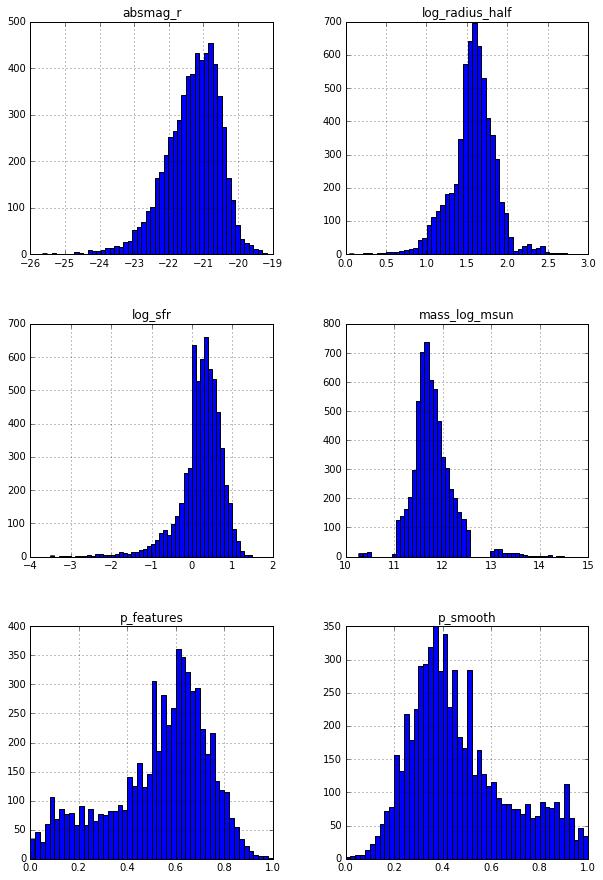

In [21]:
galaxyPropertiesAndVotesIllustrisFrame['radius_half'] = 10**galaxyPropertiesAndVotesIllustrisFrame['log_radius_half']
galaxyPropertiesAndVotesIllustrisFrame['mass_msun'] = 10**galaxyPropertiesAndVotesIllustrisFrame['mass_log_msun']
galaxyPropertiesAndVotesIllustrisFrame['sfr'] = 10**galaxyPropertiesAndVotesIllustrisFrame['log_sfr']
galaxyPropertiesAndVotesIllustrisFrame[galaxyPropertiesAndVotesIllustrisFrame['priority'] == "fixed_view"].hist(bins=50, figsize=(10, 15), column=["mass_log_msun", "log_radius_half", "log_sfr", "absmag_r", 'p_smooth', 'p_features'])

### Plot distributions of summary quantities extracted from the GalaxyZoo database for the `fixed_mass` subset

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x11060e898>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x1118b4e80>]], dtype=object)

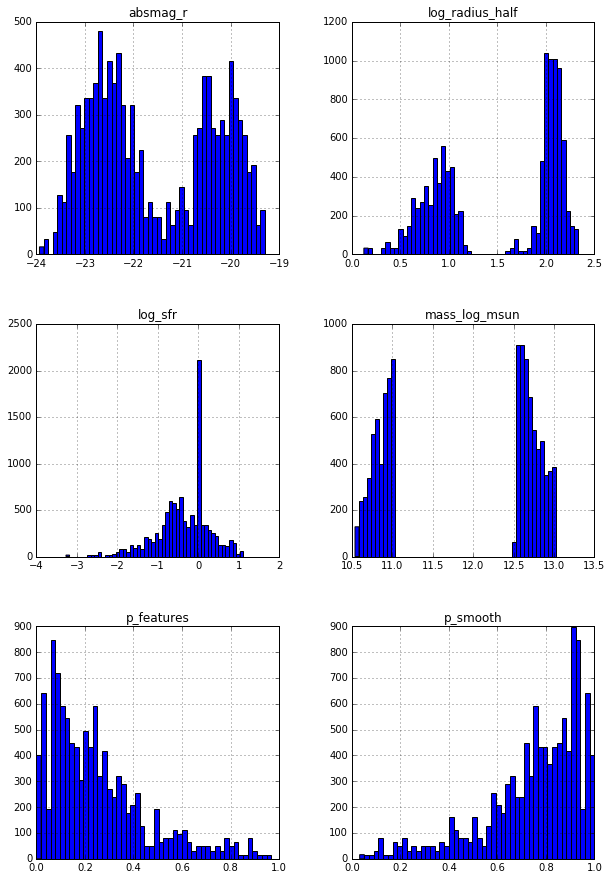

In [22]:
galaxyPropertiesAndVotesIllustrisFrame[galaxyPropertiesAndVotesIllustrisFrame['priority'] == "fixed_mass"].hist(bins=50, figsize=(10, 15), column=["mass_log_msun", "log_radius_half", "log_sfr", "absmag_r", 'p_smooth', 'p_features'])

### Use the Illustris web service to obtain detailed information for the subset of galaxies used in GalaxyZoo.
The GalaxyZoo mongo database entry for each subject includes a `metadata` field, which includes a subset of salient information about provided by the Illustris team for each subhalo in the GalaxyZoo database.

Far more detailed information can be retrieved for each subhalo using the **Illustris web service**.

The API key must be renewed by logging into the [*Illustris* public data access site](http://www.illustris-project.org/data/) and will remain current until you explicity log out. Update the subsequent cell with your personall API access key.

In [23]:
illustrisAPIKey="44ddc0a0574472a27514600007f1a6a1"

Use the `requests` module to retrieve data frome the *Illustris* web service.

In [24]:
import requests
baseUrl = 'http://www.illustris-project.org/api/'
headers = {"api-key":illustrisAPIKey}

Define a utility function to retrieve data by supplying a constructed web service path.

In [25]:
def get(path, params=None):
    # make HTTP GET request to path
    r = requests.get(path, params=params, headers=headers)
    
    # raise exception if response code is not HTTP SUCCESS (200)
    r.raise_for_status()
    
    if r.headers['content-type'] == 'application/json':
        return r.json() # parse json responses automatically
    return r

Sending a request to the base URL of the web service returns a high level description of the available datasets and the base URLs that should be queried to access them.

In [26]:
illustrisWebService = get(baseUrl)
if verbose :
    prettyPrinter.pprint(illustrisWebService)

{   'simulations': [   {   'name': 'Illustris-1',
                           'num_snapshots': 134,
                           'url': 'http://www.illustris-project.org/api/Illustris-1/'},
                       {   'name': 'Illustris-1-Dark',
                           'num_snapshots': 136,
                           'url': 'http://www.illustris-project.org/api/Illustris-1-Dark/'},
                       {   'name': 'Illustris-2',
                           'num_snapshots': 136,
                           'url': 'http://www.illustris-project.org/api/Illustris-2/'},
                       {   'name': 'Illustris-2-Dark',
                           'num_snapshots': 136,
                           'url': 'http://www.illustris-project.org/api/Illustris-2-Dark/'},
                       {   'name': 'Illustris-3',
                           'num_snapshots': 136,
                           'url': 'http://www.illustris-project.org/api/Illustris-3/'},
                       {   'name': 'Illustris

Metadata about available simulation data are stored under the `simulations` key. In fact, querying the base URL only returns the `simulations` key, but this extral level of structure is likely provided to enable extensibility in the future.

Each element of the data structure uder the `simulations` key contains three sub-elements:
1. `name` - A human-readable name for the simulation e.g "Illustris-1"
    - The number (1-3) in the suffix correpsonds to the number of n-body particles used to simulate the various components (dark matter, gas, stars etc.) in the simulation. Lower numbers correspond to more particles and therefore to a hugher overall resoltution for the simulation.
    - A `-Dark` suffix is used to indicate dark-matter-only simulations that do not simulate gas and stellar dynamics.
    - Some simulations have also
2. `num_snapshots` - Each simulation dataset comprises a series of "snapshots" that capture the state of the simulation at a particular reshift (or alternatively, expansion factor). This datum specifies the number of such snapshots for each simulation set.
3. `url` - The base URL to query for data pertaining to the named simulation set.

In [27]:
simulationsData = illustrisWebService['simulations']
if verbose :
    prettyPrinter.pprint(simulationsData)

[   {   'name': 'Illustris-1',
        'num_snapshots': 134,
        'url': 'http://www.illustris-project.org/api/Illustris-1/'},
    {   'name': 'Illustris-1-Dark',
        'num_snapshots': 136,
        'url': 'http://www.illustris-project.org/api/Illustris-1-Dark/'},
    {   'name': 'Illustris-2',
        'num_snapshots': 136,
        'url': 'http://www.illustris-project.org/api/Illustris-2/'},
    {   'name': 'Illustris-2-Dark',
        'num_snapshots': 136,
        'url': 'http://www.illustris-project.org/api/Illustris-2-Dark/'},
    {   'name': 'Illustris-3',
        'num_snapshots': 136,
        'url': 'http://www.illustris-project.org/api/Illustris-3/'},
    {   'name': 'Illustris-3-Dark',
        'num_snapshots': 136,
        'url': 'http://www.illustris-project.org/api/Illustris-3-Dark/'},
    {   'name': 'Illustris-1-Subbox0',
        'num_snapshots': 3970,
        'url': 'http://www.illustris-project.org/api/Illustris-1-Subbox0/'},
    {   'name': 'Illustris-1-Subbox1',
    

The names of the various simulation datasets can be isolated by indexing the data structure stored under the `simulations` key.

In [28]:
illustrisSimulationNames = [ entry['name'] for entry in simulationsData ]
if verbose :
    prettyPrinter.pprint(illustrisSimulationNames)

[   'Illustris-1',
    'Illustris-1-Dark',
    'Illustris-2',
    'Illustris-2-Dark',
    'Illustris-3',
    'Illustris-3-Dark',
    'Illustris-1-Subbox0',
    'Illustris-1-Subbox1',
    'Illustris-1-Subbox2',
    'Illustris-1-Subbox3',
    'Illustris-2-Subbox0',
    'Illustris-2-Subbox1',
    'Illustris-2-Subbox2',
    'Illustris-2-Subbox3',
    'Illustris-3-Subbox0',
    'Illustris-3-Subbox1',
    'Illustris-3-Subbox2',
    'Illustris-3-Subbox3']


Use the highest resolution simulation with the full physics model i.e. `Illustris-1`. Begin by determining the numerical index in the list of dataset names that corresponds to the required simulation.

In [29]:
illustris1SimulationIndex = illustrisSimulationNames.index('Illustris-1')

Retrieve more detailed metadata that correspond to the `Illustris-1` dataset.

In [30]:
illustris1Data = get(simulationsData[illustris1SimulationIndex]['url'])
if verbose :
    prettyPrinter.pprint(illustris1Data)

{   'boxsize': 75000.0,
    'checksums': 'http://www.illustris-project.org/api/Illustris-1/checksums/',
    'child_simulations': [   'http://www.illustris-project.org/api/Illustris-1-Subbox0/',
                             'http://www.illustris-project.org/api/Illustris-1-Subbox1/',
                             'http://www.illustris-project.org/api/Illustris-1-Subbox2/',
                             'http://www.illustris-project.org/api/Illustris-1-Subbox3/'],
    'cosmology': 'WMAP-9',
    'description': 'Main high-resolution Illustris run including the full '
                   'physics model.',
    'files': {   'sublink': 'http://www.illustris-project.org/api/Illustris-1/files/sublink/'},
    'filesize_ctrees': 0.0,
    'filesize_lhalotree': 167729443516.0,
    'filesize_sublink': 369746217990.0,
    'has_blackholes': True,
    'has_cooling': True,
    'has_ctrees': False,
    'has_fof': True,
    'has_lhalotree': False,
    'has_rockstar': False,
    'has_starformation': True,
    

Retrieve metadata about the snapshots that comprise the `Illustris-1` dataset.

In [31]:
illustris1SnapshotsUrl = illustris1Data['snapshots']
illustris1Snapshots = get(illustris1SnapshotsUrl)

Retrive metadata describing the lowest redshift snapshot i.e. that with the highest numerical index.

In [32]:
illustris1RedshiftZeroSnapshot = get(illustris1Snapshots[-1]['url'])
if verbose :
    prettyPrinter.pprint(illustris1RedshiftZeroSnapshot)

{   'files': {   'groupcat': 'http://www.illustris-project.org/api/Illustris-1/files/groupcat-135/',
                 'snapshot': 'http://www.illustris-project.org/api/Illustris-1/files/snapshot-135/'},
    'filesize_groupcat': 4812516112.0,
    'filesize_rockstar': 0.0,
    'filesize_snapshot': 1641304217072.0,
    'num_bhs': 32552,
    'num_dm': 6028568000,
    'num_gas': 5268982240,
    'num_groups_fof': 7713601,
    'num_groups_rockstar': 0,
    'num_groups_subfind': 4366546,
    'num_stars': 606875892,
    'num_trmc': 6028568000,
    'number': 135,
    'redshift': 2.2204460492503099e-16,
    'simulation': 'http://www.illustris-project.org/api/Illustris-1/',
    'subhalos': 'http://www.illustris-project.org/api/Illustris-1/snapshots/135/subhalos/',
    'url': 'http://www.illustris-project.org/api/Illustris-1/snapshots/135/'}


### Retrieve and serialize **metadata** for **all** subhalos in the "zero" redshift slice
Retrieve metadata describing the individual sub-halos comprising the snapshot from the *Illustris* web service in batches of $10^5$ until the number of unique sub-halos that comprised the original GalaxyZoo Illustris sample ($\sim6\times10^{5}$) is exceeded.

In [33]:
illustris1RedshiftZeroSubHalos = get(illustris1RedshiftZeroSnapshot['subhalos'], {'limit':10000})
illustris1RedshiftZeroSubHaloMetaData = illustris1RedshiftZeroSubHalos['results']

The data that are returned include an index named `next` that derefernces to a URL can be used to retrieve the next block of $10^{5}$ halo metadata. Recursively query this URL until data for the requisite number of halos have been retrieved.

In [34]:
if saveIllustrisHaloData :
    while len(illustris1RedshiftZeroSubHaloMetaData) < galaxyPropertiesIllustrisFrame.index.max() and illustris1RedshiftZeroSubHalos['next'] is not None :
        illustris1RedshiftZeroSubHalos = get(illustris1RedshiftZeroSubHalos['next'])
        illustris1RedshiftZeroSubHaloMetaData.extend(illustris1RedshiftZeroSubHalos['results'])
        if verbose :
            # How many halos have data been downloaded for?
            print(len(illustris1RedshiftZeroSubHaloMetaData))
            # The URL that should be queried to retrieve the next block of data
            print(illustris1RedshiftZeroSubHalos['next'])
else :
    print ('Loading data from "{0}"...'.format(pickleMetaDataPath))
    pickleMetaDataFile = open(pickleMetaDataPath, mode='rb')
    illustris1RedshiftZeroSubHaloMetaDataFrame = pickle.load(pickleMetaDataFile)
    pickleMetaDataFile.close()

Loading data from "/Users/hughdickinson/Documents/Development/Sloan-Illustris-Comparison/data/IllustrisHaloMetaData.pkl"...


Wrap the retrieved data in a `pandas.DataFrame` to simplify manipulation and plotting.

In [35]:
if saveIllustrisHaloData :
    illustris1RedshiftZeroSubHaloMetaDataFrame = pd.DataFrame(illustris1RedshiftZeroSubHaloMetaData)
    illustris1RedshiftZeroSubHaloMetaDataFrame = illustris1RedshiftZeroSubHaloMetaDataFrame.set_index("id")
if verbose:
    display(illustris1RedshiftZeroSubHaloMetaDataFrame)
if saveIllustrisHaloData :
    illustris1RedshiftZeroSubHaloMetaDataFrame.to_pickle(pickleMetaDataPath)

,mass_log_msun,url
id,,
0,14.498287,http://www.illustris-project.org/api/Illustris...
1,13.498518,http://www.illustris-project.org/api/Illustris...
2,12.910891,http://www.illustris-project.org/api/Illustris...
3,12.569018,http://www.illustris-project.org/api/Illustris...
4,12.598189,http://www.illustris-project.org/api/Illustris...
5,12.618469,http://www.illustris-project.org/api/Illustris...
6,12.652393,http://www.illustris-project.org/api/Illustris...
7,12.550701,http://www.illustris-project.org/api/Illustris...
8,12.446746,http://www.illustris-project.org/api/Illustris...


### Sanity Check

As a consistency check, compare the masses of the subhalos retrieved from the GalaxyZoo database with those retrieved directly from the *Illustris* web service. They should be very close if the data correspond to the same subhalos. **NOTE:** Numerical accuracy may prevent exact matches between the two data sources.

Perform a merge which extracts metadata from the **full** (web-service-provided) Illustris zero-redshift subhalo sample with `subhalo_id` values that match those in the GalaxyZoo mongo database.

In [36]:
galaxyPropertiesIllustrisWithUrlFrame = galaxyPropertiesAndVotesIllustrisFrame.merge(illustris1RedshiftZeroSubHaloMetaDataFrame,
                                                                                     how='left', 
                                                                                     left_index=True, 
                                                                                     right_index=True,
                                                                                     suffixes=("_gz2", "_illustris_db"))
if verbose :
    display(galaxyPropertiesIllustrisWithUrlFrame)
    display(galaxyPropertiesIllustrisWithUrlFrame.columns.values)

,priority,mass_log_msun_gz2,log_radius_half,log_sfr,absmag_r,absmag_b,absmag_g,absmag_i,absmag_k,absmag_u,...,num_faceon,p_smooth,p_features,is_edge_on,is_features_and_edge_on,radius_half,mass_msun,sfr,mass_log_msun_illustris_db,url
0,fixed_view,14.500762,2.816805,0.467533,-25.6369,-24.4482,-24.8965,-25.9914,-28.2148,-24.0736,...,3,0.884615,0.115385,False,False,655.8510,3.167829e+14,2.934490,14.498287,http://www.illustris-project.org/api/Illustris...
1,fixed_view,13.500993,2.463007,-1.830140,-23.8452,-22.6115,-23.0744,-24.2132,-26.4999,-22.1658,...,11,0.694444,0.305556,False,False,290.4070,3.169514e+13,0.014786,13.498518,http://www.illustris-project.org/api/Illustris...
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,11,0.648649,0.351351,False,False,82.1751,8.191543e+12,0.951135,12.910891,http://www.illustris-project.org/api/Illustris...
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,11,0.648649,0.351351,False,False,82.1751,8.191543e+12,0.951135,12.910891,http://www.illustris-project.org/api/Illustris...
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,11,0.648649,0.351351,False,False,82.1751,8.191543e+12,0.951135,12.910891,http://www.illustris-project.org/api/Illustris...
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,11,0.648649,0.351351,False,False,82.1751,8.191543e+12,0.951135,12.910891,http://www.illustris-project.org/api/Illustris...
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,11,0.648649,0.351351,False,False,82.1751,8.191543e+12,0.951135,12.910891,http://www.illustris-project.org/api/Illustris...
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,11,0.648649,0.351351,False,False,82.1751,8.191543e+12,0.951135,12.910891,http://www.illustris-project.org/api/Illustris...
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,11,0.648649,0.351351,False,False,82.1751,8.191543e+12,0.951135,12.910891,http://www.illustris-project.org/api/Illustris...
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,11,0.648649,0.351351,False,False,82.1751,8.191543e+12,0.951135,12.910891,http://www.illustris-project.org/api/Illustris...


array(['priority', 'mass_log_msun_gz2', 'log_radius_half', 'log_sfr',
       'absmag_r', 'absmag_b', 'absmag_g', 'absmag_i', 'absmag_k',
       'absmag_u', 'absmag_v', 'absmag_z', 'num_smooth', 'num_features',
       'num_artifact', 'num_edgeon', 'num_faceon', 'p_smooth',
       'p_features', 'is_edge_on', 'is_features_and_edge_on',
       'radius_half', 'mass_msun', 'sfr', 'mass_log_msun_illustris_db',
       'url'], dtype=object)

Add a column listing (`mass_log_msun_delta`) the computed difference between the mass values provided from the Illustris web service and those stored in the GalaxyZoo mongo database.

In [37]:
galaxyPropertiesIllustrisWithUrlFrame["mass_log_msun_delta"] = galaxyPropertiesIllustrisWithUrlFrame["mass_log_msun_gz2"] - galaxyPropertiesIllustrisWithUrlFrame["mass_log_msun_illustris_db"] 
if verbose :
    display(galaxyPropertiesIllustrisWithUrlFrame)
    display(galaxyPropertiesIllustrisWithUrlFrame.columns.values)

,priority,mass_log_msun_gz2,log_radius_half,log_sfr,absmag_r,absmag_b,absmag_g,absmag_i,absmag_k,absmag_u,...,p_smooth,p_features,is_edge_on,is_features_and_edge_on,radius_half,mass_msun,sfr,mass_log_msun_illustris_db,url,mass_log_msun_delta
0,fixed_view,14.500762,2.816805,0.467533,-25.6369,-24.4482,-24.8965,-25.9914,-28.2148,-24.0736,...,0.884615,0.115385,False,False,655.8510,3.167829e+14,2.934490,14.498287,http://www.illustris-project.org/api/Illustris...,0.002475
1,fixed_view,13.500993,2.463007,-1.830140,-23.8452,-22.6115,-23.0744,-24.2132,-26.4999,-22.1658,...,0.694444,0.305556,False,False,290.4070,3.169514e+13,0.014786,13.498518,http://www.illustris-project.org/api/Illustris...,0.002475
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,0.648649,0.351351,False,False,82.1751,8.191543e+12,0.951135,12.910891,http://www.illustris-project.org/api/Illustris...,0.002475
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,0.648649,0.351351,False,False,82.1751,8.191543e+12,0.951135,12.910891,http://www.illustris-project.org/api/Illustris...,0.002475
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,0.648649,0.351351,False,False,82.1751,8.191543e+12,0.951135,12.910891,http://www.illustris-project.org/api/Illustris...,0.002475
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,0.648649,0.351351,False,False,82.1751,8.191543e+12,0.951135,12.910891,http://www.illustris-project.org/api/Illustris...,0.002475
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,0.648649,0.351351,False,False,82.1751,8.191543e+12,0.951135,12.910891,http://www.illustris-project.org/api/Illustris...,0.002475
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,0.648649,0.351351,False,False,82.1751,8.191543e+12,0.951135,12.910891,http://www.illustris-project.org/api/Illustris...,0.002475
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,0.648649,0.351351,False,False,82.1751,8.191543e+12,0.951135,12.910891,http://www.illustris-project.org/api/Illustris...,0.002475
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,0.648649,0.351351,False,False,82.1751,8.191543e+12,0.951135,12.910891,http://www.illustris-project.org/api/Illustris...,0.002475


array(['priority', 'mass_log_msun_gz2', 'log_radius_half', 'log_sfr',
       'absmag_r', 'absmag_b', 'absmag_g', 'absmag_i', 'absmag_k',
       'absmag_u', 'absmag_v', 'absmag_z', 'num_smooth', 'num_features',
       'num_artifact', 'num_edgeon', 'num_faceon', 'p_smooth',
       'p_features', 'is_edge_on', 'is_features_and_edge_on',
       'radius_half', 'mass_msun', 'sfr', 'mass_log_msun_illustris_db',
       'url', 'mass_log_msun_delta'], dtype=object)

Generate plots comparing the mass estimates stored in the metadata for each subject in the the GalaxyZoo mongo database with those retrieved directly from the Illustris web service for the same `subhalo_id`s.

First make the plot for **all** `subhalo_id` values.

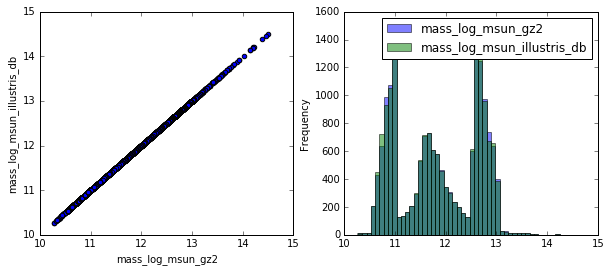

In [38]:
massCompPlots = plt.figure(figsize=(10, 4))
massCompScatterAxes = massCompPlots.add_subplot(1,2,1)
massCompHistAxes = massCompPlots.add_subplot(1,2,2)
massCompScatterAxes = galaxyPropertiesIllustrisWithUrlFrame.plot.scatter(x="mass_log_msun_gz2", y="mass_log_msun_illustris_db", ax=massCompScatterAxes)
massCompHistAxes = galaxyPropertiesIllustrisWithUrlFrame[["mass_log_msun_gz2", "mass_log_msun_illustris_db"]].plot.hist(alpha=0.5,bins=50, ax=massCompHistAxes)

Now isolate the `fixed_mass` sample.

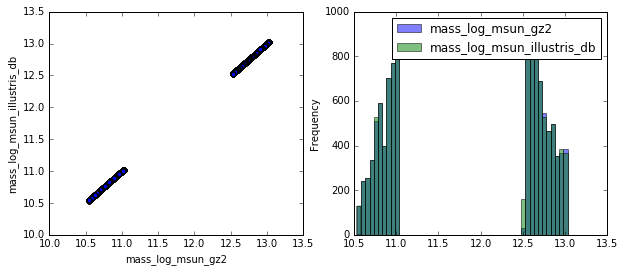

In [39]:
fixedMassMassCompPlots = plt.figure(figsize=(10, 4))
fixedMassMassCompScatterAxes = fixedMassMassCompPlots.add_subplot(1,2,1)
fixedMassMassCompHistAxes = fixedMassMassCompPlots.add_subplot(1,2,2)
fixedMassMassCompScatterAxes = galaxyPropertiesIllustrisWithUrlFrame[galaxyPropertiesIllustrisWithUrlFrame['priority'] == 'fixed_mass'].plot.scatter(x="mass_log_msun_gz2", y="mass_log_msun_illustris_db", ax=fixedMassMassCompScatterAxes)
fixedMassMassCompHistAxes = galaxyPropertiesIllustrisWithUrlFrame[galaxyPropertiesIllustrisWithUrlFrame['priority'] == 'fixed_mass'][["mass_log_msun_gz2", "mass_log_msun_illustris_db"]].plot.hist(alpha=0.5,bins=50, ax=fixedMassMassCompHistAxes)

Now isolate the `fixed_view` sample.

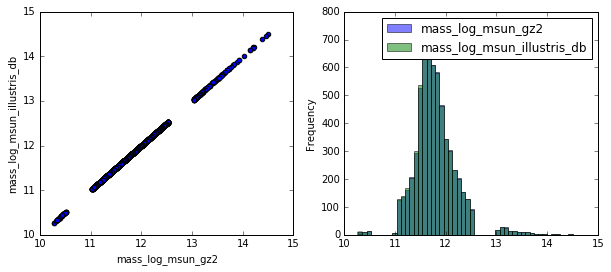

In [40]:
fixedViewMassCompPlots = plt.figure(figsize=(10, 4))
fixedViewMassCompScatterAxes = fixedViewMassCompPlots.add_subplot(1,2,1)
fixedViewMassCompHistAxes = fixedViewMassCompPlots.add_subplot(1,2,2)
fixedViewMassCompScatterAxes = galaxyPropertiesIllustrisWithUrlFrame[galaxyPropertiesIllustrisWithUrlFrame['priority'] == 'fixed_view'].plot.scatter(x="mass_log_msun_gz2", y="mass_log_msun_illustris_db", ax=fixedViewMassCompScatterAxes)
fixedViewMassCompHistAxes = galaxyPropertiesIllustrisWithUrlFrame[galaxyPropertiesIllustrisWithUrlFrame['priority'] == 'fixed_view'][["mass_log_msun_gz2", "mass_log_msun_illustris_db"]].plot.hist(alpha=0.5,bins=50, ax=fixedViewMassCompHistAxes)

**NOTE**: Apparently the `fixed_mass` and `fixed_view` subsets are **disjoint**.

### Retrieve the full data for each subhalo with a corresponding subject in GalaxyZoo 4 (Illustris subset)
So far, metadata have been retrieved for **all** subhalos comprising the Illustris-1 zero-redshift dataset. Now selectively download the **full** data for halos that were included in the initial GalaxyZoo dataset.

There are **17046** Illustris subjects that have been classified in GalaxyZoo. For the `fixed_mass` subset, there will be 16 instances of the same halo, so some of the subsequent downloads are likely unnecessary. However to be certain, the duplicate data are downloaded anyway. 

The downloaded data are serialized to a file in order to save repeated time-consuming downloads.

In [41]:
illustris1RedshiftZeroSubHaloDataFrame = None
if saveIllustrisHaloData :
    illustris1RedshiftZeroSubHaloData = []
    while len(illustris1RedshiftZeroSubHaloData) < len(galaxyPropertiesIllustrisWithUrlFrame.index) :
        numToRetrieve = min(galaxyPropertiesIllustrisWithUrlFrame.size - len(illustris1RedshiftZeroSubHaloData), 100)
        illustris1RedshiftZeroSubHaloData.extend([get(subHaloUrl) for subHaloUrl in galaxyPropertiesIllustrisWithUrlFrame.iloc[len(illustris1RedshiftZeroSubHaloData):len(illustris1RedshiftZeroSubHaloData) + numToRetrieve]['url']])
        print ('Retrieved {0} subHalo datasets.'.format(len(illustris1RedshiftZeroSubHaloData)))
else :
    pickleDataFile = open(pickleDataPath, mode='rb')
    illustris1RedshiftZeroSubHaloDataFrame = pickle.load(pickleDataFile) 
    pickleDataFile.close()

### Store the retrieved data in a `pandas.DataFrame` to enable more straightforward manipulation...

In [42]:
if saveIllustrisHaloData :
    illustris1RedshiftZeroSubHaloDataFrame = pd.DataFrame(illustris1RedshiftZeroSubHaloData)

### ... and save time retrieving the data again by serializing to a local picklefile.

In [43]:
if saveIllustrisHaloData :
    illustris1RedshiftZeroSubHaloDataFrame.to_pickle(pickleDataPath)

In [44]:
if verbose :
    prettyPrinter.pprint(illustris1RedshiftZeroSubHaloDataFrame.columns)

Index(['bhmdot', 'cm_x', 'cm_y', 'cm_z', 'cutouts', 'desc_sfid', 'desc_snap',
       'gasmetallicity', 'gasmetallicityhalfrad', 'gasmetallicitymaxrad',
       'gasmetallicitysfr', 'gasmetallicitysfrweighted', 'grnr', 'halfmassrad',
       'halfmassrad_bhs', 'halfmassrad_dm', 'halfmassrad_gas',
       'halfmassrad_stars', 'id', 'len', 'len_bhs', 'len_dm', 'len_gas',
       'len_stars', 'mass', 'mass_bhs', 'mass_dm', 'mass_gas', 'mass_log_msun',
       'mass_stars', 'massinhalfrad', 'massinhalfrad_bhs', 'massinhalfrad_dm',
       'massinhalfrad_gas', 'massinhalfrad_stars', 'massinmaxrad',
       'massinmaxrad_bhs', 'massinmaxrad_dm', 'massinmaxrad_gas',
       'massinmaxrad_stars', 'massinrad', 'massinrad_bhs', 'massinrad_dm',
       'massinrad_gas', 'massinrad_stars', 'meta', 'parent', 'pos_x', 'pos_y',
       'pos_z', 'primary_flag', 'prog_sfid', 'prog_snap', 'related', 'sfr',
       'sfrinhalfrad', 'sfrinmaxrad', 'sfrinrad', 'snap', 'spin_x', 'spin_y',
       'spin_z', 'starmetallicit

### Plot selected distributions of Illustris-computed "true" subhalo parameters 
These plots can be used to distributions of properties that may have observable proxies or couterparts, but which are computed purely using knowledge of the simulated particles comprising the subhalo.

**TODO:** To add other plots here just add more of the column names listed above between the square brackets i.e.

```python
illustris1RedshiftZeroSubHaloDataFrame[['gasmetallicityhalfrad', 'veldisp', <add more columns here...>]]...
```

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x11bbbad30>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x11507d978>]], dtype=object)

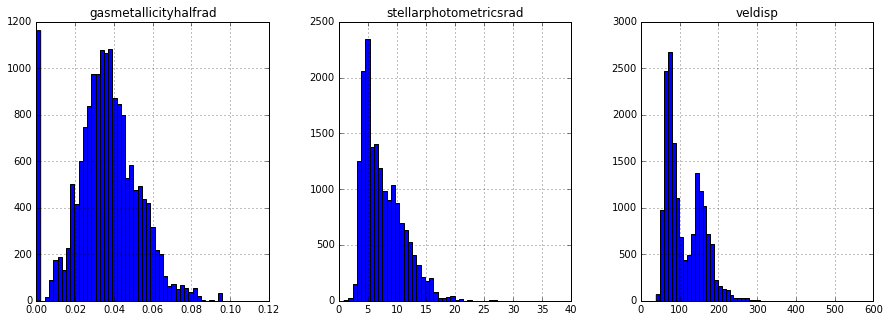

In [45]:
illustris1RedshiftZeroSubHaloDataFrame[['gasmetallicityhalfrad', 'veldisp', 'stellarphotometricsrad']].hist(bins=50, 
                                                                                  figsize=(15, 5),
                                                                                  layout=(1, 3)
                                                                                 )

Plot the distribution of stellar photometric radii with a logarithmic y-axis.

**Note**: The Illustris documentation specifies this field as: 
> Radius at which the surface brightness profile (computed from all member stellar particles) drops below the limit of $20.7\,{\rm mag\, arcsec}^{−22}$ in the K band (in comoving units).

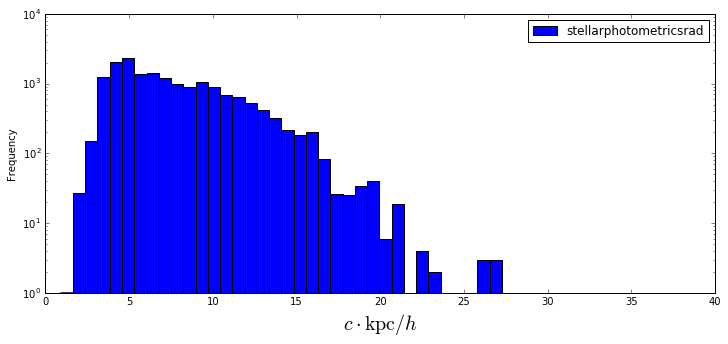

In [46]:
illustris1RedshiftZeroSubHaloDataFrame[['stellarphotometricsrad']].plot.hist(bins=50, 
                                                                        figsize=(12, 5),
                                                                       logy=True)
plt.xlabel(r'$c\cdot{\rm kpc}/h$', fontsize='20')


### Combined the full data with the prevously extracted metadata for each subhalo

In [47]:
finalIllustris1RedshiftZeroSubHaloDataFrame = galaxyPropertiesIllustrisWithUrlFrame.merge(illustris1RedshiftZeroSubHaloDataFrame.drop_duplicates(subset=['id']), 
                                                                                          how='left', 
                                                                                          left_index=True, 
                                                                                          right_on='id',
                                                                                          suffixes=("_meta", "_full"))
if verbose :
    display(finalIllustris1RedshiftZeroSubHaloDataFrame.columns.values)
    display(finalIllustris1RedshiftZeroSubHaloDataFrame)    

array(['priority', 'mass_log_msun_gz2', 'log_radius_half', 'log_sfr',
       'absmag_r', 'absmag_b', 'absmag_g', 'absmag_i', 'absmag_k',
       'absmag_u', 'absmag_v', 'absmag_z', 'num_smooth', 'num_features',
       'num_artifact', 'num_edgeon', 'num_faceon', 'p_smooth',
       'p_features', 'is_edge_on', 'is_features_and_edge_on',
       'radius_half', 'mass_msun', 'sfr_meta',
       'mass_log_msun_illustris_db', 'url', 'mass_log_msun_delta',
       'bhmdot', 'cm_x', 'cm_y', 'cm_z', 'cutouts', 'desc_sfid',
       'desc_snap', 'gasmetallicity', 'gasmetallicityhalfrad',
       'gasmetallicitymaxrad', 'gasmetallicitysfr',
       'gasmetallicitysfrweighted', 'grnr', 'halfmassrad',
       'halfmassrad_bhs', 'halfmassrad_dm', 'halfmassrad_gas',
       'halfmassrad_stars', 'id', 'len', 'len_bhs', 'len_dm', 'len_gas',
       'len_stars', 'mass', 'mass_bhs', 'mass_dm', 'mass_gas',
       'mass_log_msun', 'mass_stars', 'massinhalfrad', 'massinhalfrad_bhs',
       'massinhalfrad_dm', 'massinhal

,priority,mass_log_msun_gz2,log_radius_half,log_sfr,absmag_r,absmag_b,absmag_g,absmag_i,absmag_k,absmag_u,...,stellarphotometricsrad,supplementary_data,trees,vel_x,vel_y,vel_z,veldisp,vmax,vmaxrad,windmass
0,fixed_view,14.500762,2.816805,0.467533,-25.6369,-24.4482,-24.8965,-25.9914,-28.2148,-24.0736,...,37.5182,{'stellar_mocks': {'image_subhalo': 'http://ww...,{'sublink': 'http://www.illustris-project.org/...,25.2801,-217.0670,-82.0048,530.0060,857.801,499.4480,0.969088
1,fixed_view,13.500993,2.463007,-1.830140,-23.8452,-22.6115,-23.0744,-24.2132,-26.4999,-22.1658,...,17.3275,{'stellar_mocks': {'image_subhalo': 'http://ww...,{'sublink': 'http://www.illustris-project.org/...,77.8400,599.7980,521.1330,261.1230,411.439,124.5930,0.235200
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,13.9054,{'stellar_mocks': {'image_subhalo': 'http://ww...,{'sublink': 'http://www.illustris-project.org/...,309.6180,-565.6190,848.2140,264.0360,391.851,112.0800,0.001990
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,13.9054,{'stellar_mocks': {'image_subhalo': 'http://ww...,{'sublink': 'http://www.illustris-project.org/...,309.6180,-565.6190,848.2140,264.0360,391.851,112.0800,0.001990
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,13.9054,{'stellar_mocks': {'image_subhalo': 'http://ww...,{'sublink': 'http://www.illustris-project.org/...,309.6180,-565.6190,848.2140,264.0360,391.851,112.0800,0.001990
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,13.9054,{'stellar_mocks': {'image_subhalo': 'http://ww...,{'sublink': 'http://www.illustris-project.org/...,309.6180,-565.6190,848.2140,264.0360,391.851,112.0800,0.001990
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,13.9054,{'stellar_mocks': {'image_subhalo': 'http://ww...,{'sublink': 'http://www.illustris-project.org/...,309.6180,-565.6190,848.2140,264.0360,391.851,112.0800,0.001990
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,13.9054,{'stellar_mocks': {'image_subhalo': 'http://ww...,{'sublink': 'http://www.illustris-project.org/...,309.6180,-565.6190,848.2140,264.0360,391.851,112.0800,0.001990
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,13.9054,{'stellar_mocks': {'image_subhalo': 'http://ww...,{'sublink': 'http://www.illustris-project.org/...,309.6180,-565.6190,848.2140,264.0360,391.851,112.0800,0.001990
2,fixed_mass,12.913366,1.914740,-0.021758,-23.2818,-22.0652,-22.5203,-23.6522,-25.9588,-21.6659,...,13.9054,{'stellar_mocks': {'image_subhalo': 'http://ww...,{'sublink': 'http://www.illustris-project.org/...,309.6180,-565.6190,848.2140,264.0360,391.851,112.0800,0.001990


### Extract and plot the images that comprised the GalaxyZoo Illustris datasets
Extract and plot 20 random images from the `fixed_mass` and `fixed_view` subsamples.

First randomly select 20 images from the `fixed_view` sample.

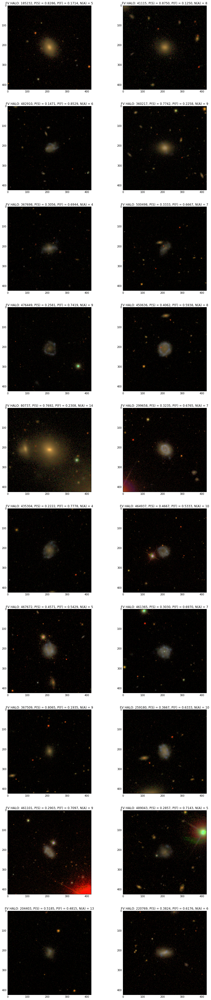

In [48]:
plt.figure(figsize=(15, 70))
subPlotNum = 1
while subPlotNum < 21 :
    try :
        row = finalIllustris1RedshiftZeroSubHaloDataFrame[finalIllustris1RedshiftZeroSubHaloDataFrame['priority'] == 'fixed_view'][['supplementary_data','id', 'p_smooth', 'p_features', 'num_artifact']].sample(1)
        imageUrl = row['supplementary_data'].values[0]['stellar_mocks']['image_gz']
        haloId = row['id'].values[0] 
        pSmooth = row['p_smooth'].values[0] 
        pFeatures = row['p_features'].values[0] 
        nArtifact = row['num_artifact'].values[0]
        http = urllib3.PoolManager()
        resp = http.request('GET', imageUrl, headers = {'API-Key': '44ddc0a0574472a27514600007f1a6a1'})
        content = resp.data
        if resp.status != 200 :
            print('HALO ID:',haloId ,resp.status)
            continue
        fakeFile = io.BytesIO()
        fakeFile.write(content)
        plt.subplot(10,2,subPlotNum)
        image = skimage.io.imread(fakeFile)
        plt.imshow(image)
        plt.title('FV HALO: {0}, P(S) = {1:.4f}, P(F) = {2:.4f}, N(A) = {3}'.format(haloId, pSmooth, pFeatures, nArtifact))
        subPlotNum += 1
    except KeyError :
        continue

Now the `fixed_mass` subset.

HALO ID: 30496 404


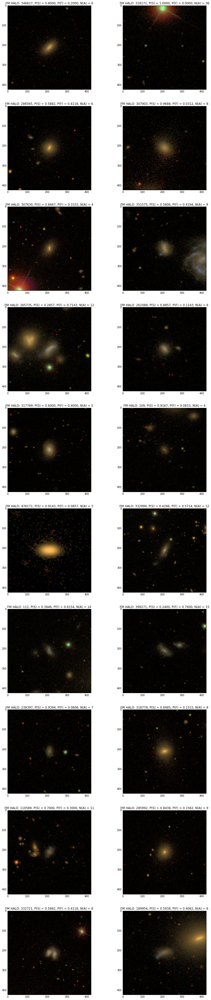

In [49]:
plt.figure(figsize=(15, 70))
subPlotNum = 1
while subPlotNum < 21 :
    try :
        row = finalIllustris1RedshiftZeroSubHaloDataFrame[finalIllustris1RedshiftZeroSubHaloDataFrame['priority'] == 'fixed_mass'][['supplementary_data','id', 'p_smooth', 'p_features', 'num_artifact']].sample(1)
        imageUrl = row['supplementary_data'].values[0]['stellar_mocks']['image_gz']
        haloId = row['id'].values[0] 
        pSmooth = row['p_smooth'].values[0] 
        pFeatures = row['p_features'].values[0]
        nArtifact = row['num_artifact'].values[0]
        http = urllib3.PoolManager()
        resp = http.request('GET', imageUrl, headers = {'API-Key': '44ddc0a0574472a27514600007f1a6a1'})
        content = resp.data
        if resp.status != 200 :
            print('HALO ID:',haloId ,resp.status)
            continue
        fakeFile = io.BytesIO()
        fakeFile.write(content)
        plt.subplot(10,2,subPlotNum)
        image = skimage.io.imread(fakeFile)
        plt.imshow(image)
        plt.title('FM HALO: {0}, P(S) = {1:.4f}, P(F) = {2:.4f}, N(A) = {3}'.format(haloId, pSmooth, pFeatures, nArtifact))
        subPlotNum += 1
    except KeyError :
        continue

## Plot subsets of *featured* classified as *edge on* or *not edge on*
A subject os defined to be *featured* if `p_features` > 0.6.

### Start with the *edge_on* subset

Number of Halos with p_features > 0.6 and a majority of "edge on" classifications is 263.
Number of Halos with only a majority of "edge on" classifications is 3072.


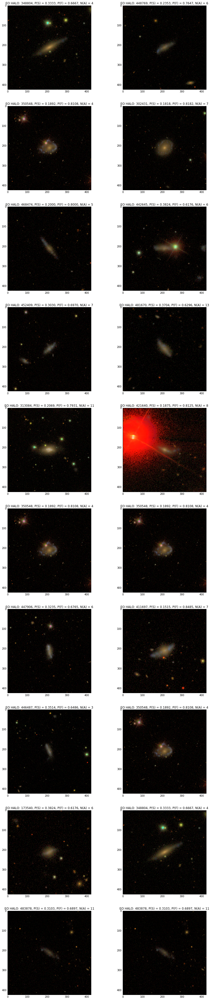

In [89]:
plt.figure(figsize=(15, 70))
subPlotNum = 1
while subPlotNum < 21 :
    try :
        row = finalIllustris1RedshiftZeroSubHaloDataFrame[finalIllustris1RedshiftZeroSubHaloDataFrame['is_features_and_edge_on']][['supplementary_data','id', 'p_smooth', 'p_features', 'num_artifact']].sample(1)
        imageUrl = row['supplementary_data'].values[0]['stellar_mocks']['image_gz']
        haloId = row['id'].values[0] 
        pSmooth = row['p_smooth'].values[0] 
        pFeatures = row['p_features'].values[0]
        nArtifact = row['num_artifact'].values[0]
        http = urllib3.PoolManager()
        resp = http.request('GET', imageUrl, headers = {'API-Key': '44ddc0a0574472a27514600007f1a6a1'})
        content = resp.data
        if resp.status != 200 :
            print('HALO ID:',haloId ,resp.status)
            continue
        fakeFile = io.BytesIO()
        fakeFile.write(content)
        plt.subplot(10,2,subPlotNum)
        image = skimage.io.imread(fakeFile)
        plt.imshow(image)
        plt.title('EO HALO: {0}, P(S) = {1:.4f}, P(F) = {2:.4f}, N(A) = {3}'.format(haloId, pSmooth, pFeatures, nArtifact))
        subPlotNum += 1
    except KeyError :
        continue
print ('Number of Halos with p_features > 0.6 and a majority of "edge on" classifications is {}.'.format(np.sum(finalIllustris1RedshiftZeroSubHaloDataFrame['is_features_and_edge_on'].values)))
print ('Number of Halos with only a majority of "edge on" classifications is {}.'.format(np.sum(finalIllustris1RedshiftZeroSubHaloDataFrame['is_edge_on'].values)))

### Now the *not edge on* subset

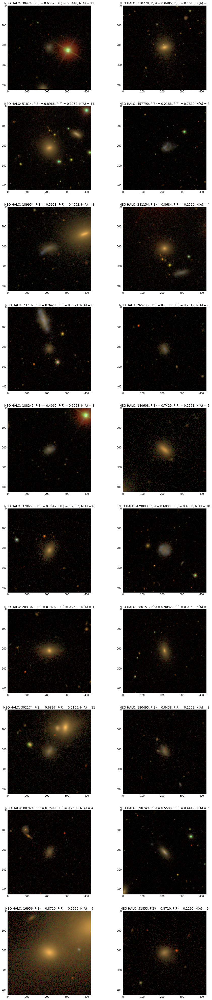

In [51]:
plt.figure(figsize=(15, 70))
subPlotNum = 1
while subPlotNum < 21 :
    try :
        row = finalIllustris1RedshiftZeroSubHaloDataFrame[np.logical_not(finalIllustris1RedshiftZeroSubHaloDataFrame['is_features_and_edge_on'])][['supplementary_data','id', 'p_smooth', 'p_features', 'num_artifact']].sample(1)
        imageUrl = row['supplementary_data'].values[0]['stellar_mocks']['image_gz']
        haloId = row['id'].values[0] 
        pSmooth = row['p_smooth'].values[0] 
        pFeatures = row['p_features'].values[0]
        nArtifact = row['num_artifact'].values[0]
        http = urllib3.PoolManager()
        resp = http.request('GET', imageUrl, headers = {'API-Key': '44ddc0a0574472a27514600007f1a6a1'})
        content = resp.data
        if resp.status != 200 :
            print('HALO ID:',haloId ,resp.status)
            continue
        fakeFile = io.BytesIO()
        fakeFile.write(content)
        plt.subplot(10,2,subPlotNum)
        image = skimage.io.imread(fakeFile)
        plt.imshow(image)
        plt.title('NEO HALO: {0}, P(S) = {1:.4f}, P(F) = {2:.4f}, N(A) = {3}'.format(haloId, pSmooth, pFeatures, nArtifact))
        subPlotNum += 1
    except KeyError :
        continue

### Create views of the dataframe for the `fixed_mass` and `fixed_view` subsets

In [52]:
finalIllustris1RedshiftZeroSubHaloDataFrames = { 'full' : finalIllustris1RedshiftZeroSubHaloDataFrame,
                                                'fixed_mass' : finalIllustris1RedshiftZeroSubHaloDataFrame[finalIllustris1RedshiftZeroSubHaloDataFrame['priority'] =='fixed_mass'],
                                                'fixed_view' : finalIllustris1RedshiftZeroSubHaloDataFrame[finalIllustris1RedshiftZeroSubHaloDataFrame['priority'] =='fixed_view'],
                                                'edge_on' : finalIllustris1RedshiftZeroSubHaloDataFrame[finalIllustris1RedshiftZeroSubHaloDataFrame['is_edge_on']],
                                                'not_edge_on' : finalIllustris1RedshiftZeroSubHaloDataFrame[np.logical_not(finalIllustris1RedshiftZeroSubHaloDataFrame['is_edge_on'])],
                                                'features_and_edge_on' : finalIllustris1RedshiftZeroSubHaloDataFrame[finalIllustris1RedshiftZeroSubHaloDataFrame['is_features_and_edge_on']]
                                                }

### Transform the simulated subhalo properties to enable comparison with observational counterparts
The units and scalings that characterize the Illustris data are optimized to enable analytical uniformity across redshift slices, however they are ot ideal for comparison with observational data at low reshifts.

The prescription outlined [here](http://ramon-1.wikispaces.com/Illustris) can be used to compute and plot the distribution of the stellar masses associated with each subhalo that has been classified in GalaxyZoo.

First plot the distribution for **all** subhalos.

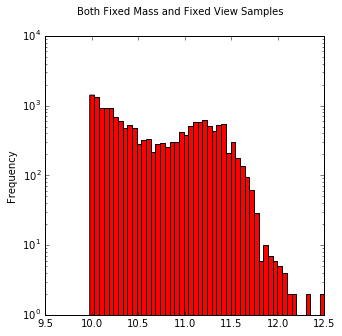

In [53]:
hubbleH = 0.74
plt.figure(figsize=(5, 5))
plt.suptitle('Both Fixed Mass and Fixed View Samples')
illustrisStellarMassesFull = np.log10(10**10*finalIllustris1RedshiftZeroSubHaloDataFrames['full']["mass_stars"]/hubbleH)
logMassAxes = illustrisStellarMassesFull.plot.hist(bins=50, logy=True, color='r')

Now isolate the `fixed_view` sample.

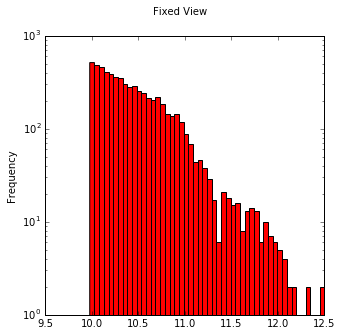

In [54]:
plt.figure(figsize=(5, 5))
plt.suptitle("Fixed View")
illustrisStellarMassesFixedView = np.log10(10**10*finalIllustris1RedshiftZeroSubHaloDataFrames['fixed_view']["mass_stars"]/hubbleH)
logMassAxes = illustrisStellarMassesFixedView.plot.hist(bins=50, logy=True, color='r')

Now isolate the `fixed_mass` sample.

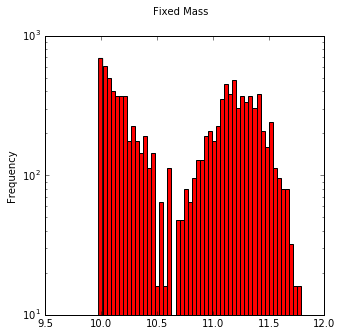

In [55]:
plt.figure(figsize=(5, 5))
plt.suptitle("Fixed Mass")
illustrisStellarMassesFixedMass = np.log10(10**10*finalIllustris1RedshiftZeroSubHaloDataFrames['fixed_mass']["mass_stars"]/hubbleH)
logMassAxes = illustrisStellarMassesFixedMass.plot.hist(bins=50, logy=True, color='r')

Overplot the two sample mass distributions

In [56]:
illustrisStellarMasses = { 'full' : illustrisStellarMassesFull,
                          'fixed_mass' : illustrisStellarMassesFixedMass,
                          'fixed_view' : illustrisStellarMassesFixedView
                         }

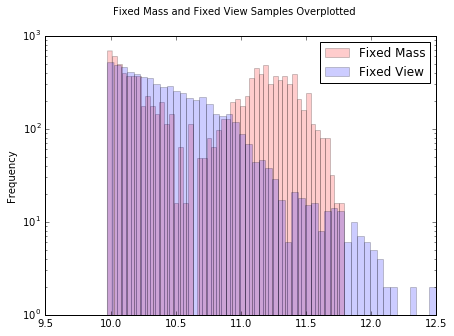

In [57]:
plt.figure(figsize=(7, 5))
plt.suptitle('Fixed Mass and Fixed View Samples Overplotted')
logMassAxes = illustrisStellarMasses['fixed_mass'].plot.hist(bins=50, logy=True, color='r', alpha=0.2, label='Fixed Mass')
logMassAxes = illustrisStellarMasses['fixed_view'].plot.hist(bins=50, logy=True, color='b', alpha=0.2, ax=logMassAxes, label='Fixed View')
handles, labels = logMassAxes.get_legend_handles_labels()
logMassAxes.legend(handles, labels)

### Query the CasJobs interface to retrieve physical parameter estimates derived from observation

In [58]:
authToken = '5aa617a918c24cebbc7884d186f08c75'
import SciServer.LoginPortal
SciServer.LoginPortal.setKeystoneToken(authToken)
userManager = SciServer.LoginPortal.getKeystoneUserWithToken(authToken)

In [59]:
print(userManager.userName)

hughdickinson


### Retrieve data for all SDSS galaxies that were classified in GalaxyZoo 2 and have 0.04 < z < 0.06
**Notes**:
The SDSS database lists numerous measurements and derived estimates of the **apparent** magnitude for many galaxies in its dataset. Here the magnitude computed within the **petrosian** radius in each of the SDSS bands (u,g,r,i,z) is used.

Apparent magnitudes are converted to an **absolute** magnitude using the function `fCosmoAbsMag` provided by the SDSS database server. Default values are used for the cosmological description which correspoond with WMAP-5 values. In contrast, the Illustris simulation framework assumes the WMAP-9 values for its cosmological simulation. Since the selected galaxies all have 0.04 < z < 0.06 and the zero-redshift slice of the Illustris simulation was used, this discrepancy should not be problematic.

Vote fraction "probabilities" derived from GalaxyZoo classifications are also extracted for all galaxies.

In [122]:
zooColumnQuery = """SELECT name FROM DBColumns WHERE tablename='zoo2MainSpecz' AND name <> 'specobjid'"""
zooColumnResult = CasJobs.executeQuery(zooColumnQuery, "dr10",token=authToken)
zooColumsString = ', '.join(['zoo.' + colName for colName in zooColumnResult['name']])

In [123]:
sdssQuery = """SELECT spec.z, spec.zErr, spec.zWarning, 
spec.petroMag_u, spec.petroMag_g, spec.petroMag_r, spec.petroMag_i, spec.petroMag_z,   
dbo.fCosmoAbsMag(spec.petroMag_u,spec.z,DEFAULT,DEFAULT,DEFAULT,DEFAULT,DEFAULT) as absPetroMag_u,
dbo.fCosmoAbsMag(spec.petroMag_g,spec.z,DEFAULT,DEFAULT,DEFAULT,DEFAULT,DEFAULT) as absPetroMag_g,
dbo.fCosmoAbsMag(spec.petroMag_r,spec.z,DEFAULT,DEFAULT,DEFAULT,DEFAULT,DEFAULT) as absPetroMag_r,
dbo.fCosmoAbsMag(spec.petroMag_i,spec.z,DEFAULT,DEFAULT,DEFAULT,DEFAULT,DEFAULT) as absPetroMag_i,
dbo.fCosmoAbsMag(spec.petroMag_z,spec.z,DEFAULT,DEFAULT,DEFAULT,DEFAULT,DEFAULT) as absPetroMag_z,
zooSpecExtra.* FROM 
(
SELECT 
""" + zooColumsString + """, specExtra.*
FROM zoo2MainSpecz AS zoo 
LEFT JOIN 
galSpecExtra AS specExtra 
ON (specExtra.specObjID = zoo.specobjid) 
) 
AS zooSpecExtra 
LEFT JOIN
SpecPhoto AS spec 
ON 
(spec.specObjID = zooSpecExtra.specobjid) 
WHERE 
(spec.z > 0.04 AND spec.z < 0.06)
"""

In [125]:
sdssResult = None
if True :
    sdssResult = CasJobs.executeQuery(sdssQuery, "dr10",token=authToken)
    sdssResult.to_pickle(pickleSDSSDataPath)
else :
    sdssDataFile = open(pickleSDSSDataPath, mode='rb')
    sdssResult = pickle.load(sdssDataFile) 
    sdssDataFile.close()

### Tabulate the extracted data
The query returns a sample of **38816** (c.f. **63826** for the first GZ catalogue) galaxies within the specified redshift range.

In [126]:
display(sdssResult)

,z,zErr,zWarning,petroMag_u,petroMag_g,petroMag_r,petroMag_i,petroMag_z,absPetroMag_u,absPetroMag_g,...,specsfr_tot_p50,specsfr_tot_p84,specsfr_tot_p97p5,specsfr_tot_entropy,specsfr_fib_p2p5,specsfr_fib_p16,specsfr_fib_p50,specsfr_fib_p84,specsfr_fib_p97p5,specsfr_fib_entropy
0,0.047411,0.000012,0,18.54880,16.85961,16.03727,15.66638,15.34058,-18.064781,-19.753973,...,-12.396500,-11.543230,-10.932760,-6.278834,-14.620370,-13.665620,-12.396200,-11.487120,-10.768180,-6.340616
1,0.044529,0.000010,0,17.52230,16.12248,15.41560,15.00168,14.68496,-18.950456,-20.350277,...,-10.271360,-10.036990,-9.731944,-4.224891,-10.286080,-10.100000,-9.901456,-9.702222,-9.511468,-4.025777
2,0.054887,0.000014,0,18.22514,16.39491,15.48788,15.06513,14.75050,-18.718341,-20.548578,...,-12.542520,-11.728670,-11.066670,-6.224016,-14.650000,-13.682290,-12.499520,-11.655730,-11.041300,-6.244517
3,0.054096,0.000017,0,19.18540,17.50917,16.73115,16.36609,16.09742,-17.725289,-19.401514,...,-11.438510,-10.741670,-10.208330,-6.285340,-14.200000,-12.746810,-11.387040,-10.690370,-10.183330,-6.245118
4,0.059259,0.000012,0,18.44806,16.46276,15.58985,15.15435,14.82124,-18.668763,-20.654065,...,-12.457960,-11.523530,-10.758330,-6.382539,-14.715620,-13.727550,-12.492720,-11.624050,-10.865000,-6.324888
5,0.048742,0.000013,0,17.26015,15.53435,14.91835,14.61415,14.31575,-19.415700,-21.141508,...,-10.502740,-10.163860,-9.768749,-4.781360,-12.504550,-11.084400,-10.656200,-10.244840,-9.765517,-5.362657
6,0.049227,0.000016,0,19.55666,17.74688,16.90337,16.50956,16.22036,-17.141445,-18.951231,...,-11.909190,-11.110190,-10.488000,-6.343077,-14.297370,-13.158820,-11.850520,-11.086320,-10.550000,-6.243503
7,0.052519,0.000019,0,19.29975,17.67267,16.84611,16.45783,16.14191,-17.544206,-19.171285,...,-11.504960,-10.854840,-10.345450,-6.201453,-14.300000,-13.067500,-11.771760,-11.020170,-10.529310,-6.223401
8,0.055087,0.000016,0,18.07451,16.35515,15.49084,15.07580,14.80660,-18.877194,-20.596556,...,-12.211460,-11.382720,-10.742500,-6.322618,-14.495450,-13.382980,-12.090390,-11.256820,-10.676670,-6.299952
9,0.050788,0.000006,0,18.60359,17.40190,16.99499,16.64875,16.58631,-18.164804,-19.366495,...,-9.950209,-9.695161,-9.338000,-4.310218,-10.148950,-9.976995,-9.840381,-9.719561,-9.605693,-3.451127


In [127]:
display(sdssResult.columns.values)

array(['z', 'zErr', 'zWarning', 'petroMag_u', 'petroMag_g', 'petroMag_r',
       'petroMag_i', 'petroMag_z', 'absPetroMag_u', 'absPetroMag_g',
       'absPetroMag_r', 'absPetroMag_i', 'absPetroMag_z', 'dec',
       'decstring', 'dr7objid', 'dr8objid', 'ra', 'rastring', 'sample',
       't01_smooth_or_features_a01_smooth_count',
       't01_smooth_or_features_a01_smooth_debiased',
       't01_smooth_or_features_a01_smooth_flag',
       't01_smooth_or_features_a01_smooth_fraction',
       't01_smooth_or_features_a01_smooth_weight',
       't01_smooth_or_features_a01_smooth_weighted_fraction',
       't01_smooth_or_features_a02_features_or_disk_count',
       't01_smooth_or_features_a02_features_or_disk_debiased',
       't01_smooth_or_features_a02_features_or_disk_flag',
       't01_smooth_or_features_a02_features_or_disk_fraction',
       't01_smooth_or_features_a02_features_or_disk_weight',
       't01_smooth_or_features_a02_features_or_disk_weighted_fraction',
       't01_smooth_or_fe

## Direct comparison between SDSS and Illustris GZ Sample Mass Distributions

Comparison between the distribution of subhalo **stellar** masses from the GZ Illustris sample and the distributions of estimated **stellar** masses contained within the 50%, 84% and 97.5% **Petrosian** radii (denoted $R_{50}$, $R_{84}$, and $R_{97.5}$ on the plotted distribution axes) of the entire Galaxy Zoo II SDSS sample.

**Note**: Change the subsequent variable to restrict sampling to a particular subset of the Galaxy Zoo dataset.

In [128]:
gzSampleSubset = 'full'
gzSampleSubsetForVoteFrac = 'fixed_mass'

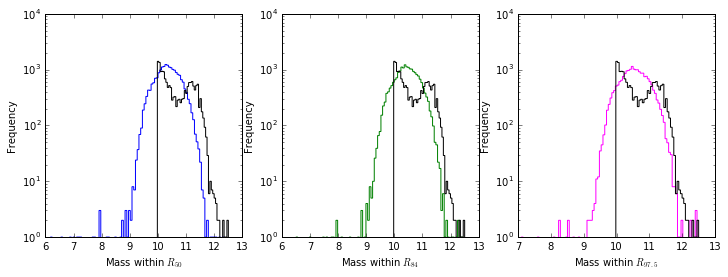

In [129]:
massCompSloanIlustrisPlots=plt.figure(figsize=(12, 4))

p50axes = massCompSloanIlustrisPlots.add_subplot(1,3,1)
p84axes = massCompSloanIlustrisPlots.add_subplot(1,3,2)
p97p5axes = massCompSloanIlustrisPlots.add_subplot(1,3,3)

sdssResult[np.logical_and(np.logical_and(sdssResult['z'] > 0.045, sdssResult['z'] < 0.055), sdssResult['lgm_tot_p50'] > -100)]['lgm_tot_p50'].plot.hist(ax=p50axes, histtype='step', color='b', fill=False, logy=True, bins=100)
p50axes.set_xlabel(r'Mass within $R_{50}$')
sdssResult[np.logical_and(np.logical_and(sdssResult['z'] > 0.045, sdssResult['z'] < 0.055), sdssResult['lgm_tot_p84'] > -100)]['lgm_tot_p84'].plot.hist(ax=p84axes, histtype='step', color='g', logy=True, bins=100)
p84axes.set_xlabel(r'Mass within $R_{84}$')
sdssResult[np.logical_and(np.logical_and(sdssResult['z'] > 0.045, sdssResult['z'] < 0.055), sdssResult['lgm_tot_p97p5'] > -100)]['lgm_tot_p97p5'].plot.hist(ax=p97p5axes, histtype='step', color='magenta', logy=True, bins=100)
p97p5axes.set_xlabel(r'Mass within $R_{97.5}$')

illustrisStellarMasses[gzSampleSubset].plot.hist(ax=p50axes, histtype='step', bins=50, logy=True, alpha=1, color='k')
illustrisStellarMasses[gzSampleSubset].plot.hist(ax=p84axes, histtype='step', bins=50, logy=True, alpha=1, color='k')
illustrisStellarMasses[gzSampleSubset].plot.hist(ax=p97p5axes, histtype='step', bins=50, logy=True, alpha=1, color='k')

## Bootstrap from the Illustris sample to match the distribution of the SDSS dataset
Randomly resample from the Illustris sample to match the SDSS mass distribution for $M>10^{10}\,{\rm M_{\odot}}$.

In [130]:
# histogram the distributions (specifying density=True produces histograms with unit integral i.e.e PDFs) 
illustrisHist = np.histogram(illustrisStellarMasses[gzSampleSubset].values,bins=100, density=True)
sdss50Sample = sdssResult[np.logical_and(np.logical_and(sdssResult['z'] > 0.045, sdssResult['z'] < 0.055), sdssResult['lgm_tot_p50'] > 10)]['lgm_tot_p50']
sdssHist50 = np.histogram(sdss50Sample.values,bins=illustrisHist[1], density = True)
sdss84Sample = sdssResult[np.logical_and(np.logical_and(sdssResult['z'] > 0.045, sdssResult['z'] < 0.055), sdssResult['lgm_tot_p84'] > 10)]['lgm_tot_p84']
sdssHist84 = np.histogram(sdss84Sample.values, bins=illustrisHist[1], density = True)
sdss97p5Sample = sdssResult[np.logical_and(np.logical_and(sdssResult['z'] > 0.045, sdssResult['z'] < 0.055), sdssResult['lgm_tot_p97p5'] > 10)]['lgm_tot_p97p5']
sdssHist97p5 = np.histogram(sdss97p5Sample.values,bins=illustrisHist[1], density = True)

# copy data into dataframes for plotting and manipulation etc.
pdfHistColNames = ['density', 'bin_low_edge', 'bin_high_edge', 'bin_centre']
pdfIllustrisFrame = pd.DataFrame([(*zipped, 0.5*(zipped[1]+zipped[2])) for zipped in zip(illustrisHist[0], illustrisHist[1][0:-1], illustrisHist[1][1:])], columns=pdfHistColNames)
pdfHist50Frame = pd.DataFrame([(*zipped, 0.5*(zipped[1]+zipped[2])) for zipped in zip(sdssHist50[0], illustrisHist[1][0:-1], illustrisHist[1][1:])], columns=pdfHistColNames)
pdfHist84Frame = pd.DataFrame([(*zipped, 0.5*(zipped[1]+zipped[2])) for zipped in zip(sdssHist84[0], illustrisHist[1][0:-1], illustrisHist[1][1:])], columns=pdfHistColNames)
pdfHist97p5Frame = pd.DataFrame([(*zipped, 0.5*(zipped[1]+zipped[2])) for zipped in zip(sdssHist97p5[0], illustrisHist[1][0:-1], illustrisHist[1][1:])], columns=pdfHistColNames)

# use rejection sampling to bootstrap a sample from the illustris data that replicates the distribution of SDSS masses
illustrisPdfSpline = scipy.interpolate.UnivariateSpline(pdfIllustrisFrame['bin_centre'].values, pdfIllustrisFrame['density'].values, s=0)
hist50PdfSpline = scipy.interpolate.UnivariateSpline(pdfHist50Frame['bin_centre'].values, pdfHist50Frame['density'].values, s=0)
hist84PdfSpline = scipy.interpolate.UnivariateSpline(pdfHist84Frame['bin_centre'].values, pdfHist84Frame['density'].values, s=0)
hist97p5PdfSpline = scipy.interpolate.UnivariateSpline(pdfHist97p5Frame['bin_centre'].values, pdfHist97p5Frame['density'].values, s=0)

bootstrapPdf50IllustrisFrame = pd.DataFrame(columns=finalIllustris1RedshiftZeroSubHaloDataFrames[gzSampleSubset].columns)
bootstrapPdf84IllustrisFrame = pd.DataFrame(columns=finalIllustris1RedshiftZeroSubHaloDataFrames[gzSampleSubset].columns)
bootstrapPdf97p5IllustrisFrame = pd.DataFrame(columns=finalIllustris1RedshiftZeroSubHaloDataFrames[gzSampleSubset].columns)

rejectionEfficiency = 11

while len(bootstrapPdf50IllustrisFrame.index) < len(sdss50Sample.index) :
    # select a random sample of rows from the illustris dataset (select more than we need)
    fullSample = finalIllustris1RedshiftZeroSubHaloDataFrames[gzSampleSubset].sample(1000)
    # generate the same number of random uniform variates
    uniformVariates = np.random.uniform(size=1000)
    # generate pdf values for the stellar masses corresponding to each of the samples
    hist50PdfVals = hist50PdfSpline(np.log10(10**10*fullSample["mass_stars"]/hubbleH))
    illustrisPdfVals = illustrisPdfSpline(np.log10(10**10*fullSample["mass_stars"]/hubbleH))
    pdfRatioVals = hist50PdfVals/(rejectionEfficiency*illustrisPdfVals)
    # select only those rows of the sample that fulfil the acceptance criterion
    filteredSample = fullSample[uniformVariates <= pdfRatioVals]
    bootstrapPdf50IllustrisFrame = pd.concat([bootstrapPdf50IllustrisFrame,filteredSample], ignore_index=True)
    
while len(bootstrapPdf84IllustrisFrame.index) < len(sdss84Sample.index) :
    # select a random sample of rows from the illustris dataset (select more than we need)
    fullSample = finalIllustris1RedshiftZeroSubHaloDataFrames[gzSampleSubset].sample(1000)
    # generate the same number of random uniform variates
    uniformVariates = np.random.uniform(size=1000)
    # generate pdf values for the stellar masses corresponding to each of the samples
    hist84PdfVals = hist84PdfSpline(np.log10(10**10*fullSample["mass_stars"]/hubbleH))
    illustrisPdfVals = illustrisPdfSpline(np.log10(10**10*fullSample["mass_stars"]/hubbleH))
    pdfRatioVals = hist84PdfVals/(rejectionEfficiency*illustrisPdfVals)
    # select only those rows of the sample that fulfil the acceptance criterion
    filteredSample = fullSample[uniformVariates <= pdfRatioVals]
    bootstrapPdf84IllustrisFrame = pd.concat([bootstrapPdf84IllustrisFrame,filteredSample], ignore_index=True)
    
rejectionEfficiency = 30
while len(bootstrapPdf97p5IllustrisFrame.index) < len(sdss97p5Sample.index) :
    # select a random sample of rows from the illustris dataset (select more than we need)
    fullSample = finalIllustris1RedshiftZeroSubHaloDataFrames[gzSampleSubset].sample(1000)
    # generate the same number of random uniform variates
    uniformVariates = np.random.uniform(size=1000)
    # generate pdf values for the stellar masses corresponding to each of the samples
    hist97p5PdfVals = hist97p5PdfSpline(np.log10(10**10*fullSample["mass_stars"]/hubbleH))
    illustrisPdfVals = illustrisPdfSpline(np.log10(10**10*fullSample["mass_stars"]/hubbleH))
    pdfRatioVals = hist97p5PdfVals/(rejectionEfficiency*illustrisPdfVals)
    # select only those rows of the sample that fulfil the acceptance criterion
    filteredSample = fullSample[uniformVariates <= pdfRatioVals]
    bootstrapPdf97p5IllustrisFrame = pd.concat([bootstrapPdf97p5IllustrisFrame,filteredSample], ignore_index=True)

## Aside: Plot PDFs for SDSS Masses within each radial limit

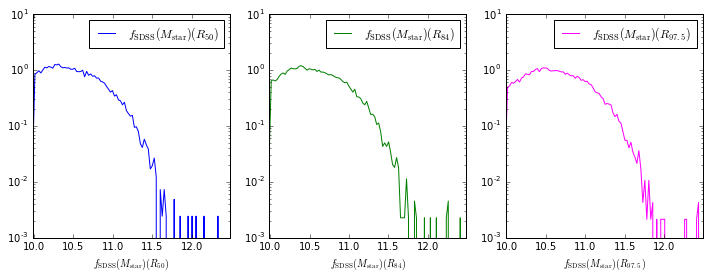

In [131]:
normalizedMassCompSloanIlustrisPlots=plt.figure(figsize=(12, 4))

p50axesNorm = normalizedMassCompSloanIlustrisPlots.add_subplot(1,3,1)
p84axesNorm = normalizedMassCompSloanIlustrisPlots.add_subplot(1,3,2)
p97p5axesNorm = normalizedMassCompSloanIlustrisPlots.add_subplot(1,3,3)

pdfHist50Frame.plot.line(x='bin_centre', y='density', ax = p50axesNorm, color='b', logy=True, label=r'$f_{\rm SDSS}(M_{\rm star}) (R_{50})$')
p50axesNorm.set_xlabel(r'$f_{\rm SDSS}(M_{\rm star}) (R_{50})$')
pdfHist84Frame.plot.line(x='bin_centre', y='density',ax = p84axesNorm, color='g', logy=True, label=r'$f_{\rm SDSS}(M_{\rm star}) (R_{84})$')
p84axesNorm.set_xlabel(r'$f_{\rm SDSS}(M_{\rm star}) (R_{84})$')
pdfHist97p5Frame.plot.line(x='bin_centre', y='density',ax = p97p5axesNorm, color='magenta', logy=True, label=r'$f_{\rm SDSS}(M_{\rm star}) (R_{97.5})$')
p97p5axesNorm.set_xlabel(r'$f_{\rm SDSS}(M_{\rm star}) (R_{97.5})$')

## Overplot the boostrapped distributions and their target distributions

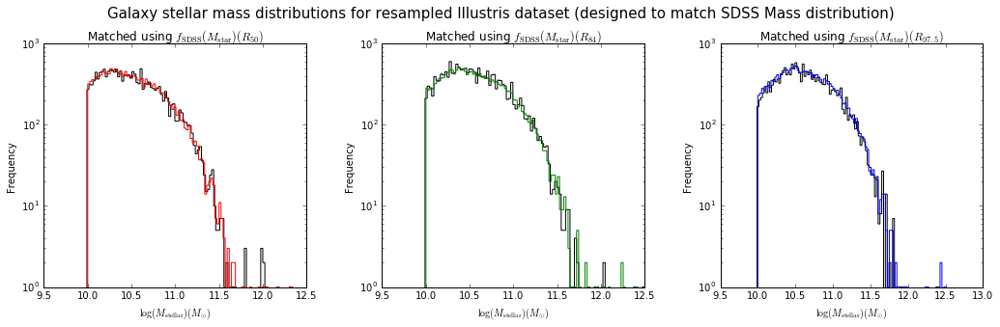

In [132]:
bootstrapMassCompSloanIlustrisPlots=plt.figure(figsize=(15, 5))
bootstrapMassCompSloanIlustrisPlots.suptitle(r'Galaxy stellar mass distributions for resampled Illustris dataset (designed to match SDSS Mass distribution)', size=15)

for index, dataset in enumerate([(bootstrapPdf50IllustrisFrame, sdss50Sample, 50, 'r'),
                               (bootstrapPdf84IllustrisFrame, sdss84Sample, 84, 'g'),
                               (bootstrapPdf97p5IllustrisFrame, sdss97p5Sample, 97.5, 'b')]) :

    bootStrapAxes = bootstrapMassCompSloanIlustrisPlots.add_subplot(1,3,index + 1)

    logStellarMasses = np.log10(10**10*dataset[0]["mass_stars"]/hubbleH)

    logStellarMasses.plot.hist(ax=bootStrapAxes, histtype='step', color='k', fill=False, logy=True, bins=100, title='Matched using ' + r'$f_{\rm SDSS}(M_{\rm star}) (R_{' + str(dataset[2]) + r'})$')
    dataset[1].plot.hist(ax=bootStrapAxes, histtype='step', color=dataset[3], fill=False, logy=True, bins=100)
    plt.xlabel(r'$\log(M_{\rm stellar}) (M_{\odot})$')

plt.tight_layout(pad=3)

## Plot the distributions of Vote fraction for the resampled datasets

In [133]:
bootstrapPdf50IllustrisFrameWithVotes = bootstrapPdf50IllustrisFrame.merge(galaxyPropertiesIllustrisWithUrlFrame, how='left', right_index=True, left_on='id', suffixes=['', '_url'])
bootstrapPdf84IllustrisFrameWithVotes = bootstrapPdf84IllustrisFrame.merge(galaxyPropertiesIllustrisWithUrlFrame, how='left', right_index=True, left_on='id', suffixes=['', '_url'])
bootstrapPdf97p5IllustrisFrameWithVotes = bootstrapPdf97p5IllustrisFrame.merge(galaxyPropertiesIllustrisWithUrlFrame, how='left', right_index=True, left_on='id', suffixes=['', '_url'])

finalIllustris1RedshiftZeroSubHaloDataFramesWithVotes = {}
for key, frame in finalIllustris1RedshiftZeroSubHaloDataFrames.items() :
    finalIllustris1RedshiftZeroSubHaloDataFramesWithVotes.update({key : frame.merge(galaxyPropertiesIllustrisWithUrlFrame, how='left', right_index=True, left_on='id', suffixes=['', '_url'])})
    
display(finalIllustris1RedshiftZeroSubHaloDataFramesWithVotes['fixed_mass'][['id', 'p_smooth', 'p_features', 'is_edge_on']])

,id,p_smooth,p_features,is_edge_on
2,2,0.648649,0.351351,False
2,2,0.648649,0.351351,False
2,2,0.648649,0.351351,False
2,2,0.648649,0.351351,False
2,2,0.648649,0.351351,False
2,2,0.648649,0.351351,False
2,2,0.648649,0.351351,False
2,2,0.648649,0.351351,False
2,2,0.648649,0.351351,False
2,2,0.648649,0.351351,False


In [70]:
display(bootstrapPdf97p5IllustrisFrameWithVotes.columns.values)
display(bootstrapPdf97p5IllustrisFrameWithVotes)

array(['priority', 'mass_log_msun_gz2', 'log_radius_half', 'log_sfr',
       'absmag_r', 'absmag_b', 'absmag_g', 'absmag_i', 'absmag_k',
       'absmag_u', 'absmag_v', 'absmag_z', 'num_smooth', 'num_features',
       'num_artifact', 'num_edgeon', 'num_faceon', 'p_smooth',
       'p_features', 'is_edge_on', 'is_features_and_edge_on',
       'radius_half', 'mass_msun', 'sfr_meta',
       'mass_log_msun_illustris_db', 'url', 'mass_log_msun_delta',
       'bhmdot', 'cm_x', 'cm_y', 'cm_z', 'cutouts', 'desc_sfid',
       'desc_snap', 'gasmetallicity', 'gasmetallicityhalfrad',
       'gasmetallicitymaxrad', 'gasmetallicitysfr',
       'gasmetallicitysfrweighted', 'grnr', 'halfmassrad',
       'halfmassrad_bhs', 'halfmassrad_dm', 'halfmassrad_gas',
       'halfmassrad_stars', 'id', 'len', 'len_bhs', 'len_dm', 'len_gas',
       'len_stars', 'mass', 'mass_bhs', 'mass_dm', 'mass_gas',
       'mass_log_msun', 'mass_stars', 'massinhalfrad', 'massinhalfrad_bhs',
       'massinhalfrad_dm', 'massinhal

,priority,mass_log_msun_gz2,log_radius_half,log_sfr,absmag_r,absmag_b,absmag_g,absmag_i,absmag_k,absmag_u,...,p_smooth_url,p_features_url,is_edge_on_url,is_features_and_edge_on_url,radius_half_url,mass_msun_url,sfr,mass_log_msun_illustris_db_url,url_url,mass_log_msun_delta_url
0,fixed_view,12.200381,1.884223,0.505212,-21.8387,-21.1211,-21.4331,-22.0737,-24.1928,-21.1668,...,0.250000,0.750000,False,False,76.5989,1.586286e+12,3.200460,12.197907,http://www.illustris-project.org/api/Illustris...,0.002475
1,fixed_view,11.688015,1.649967,-0.672805,-20.2663,-19.1845,-19.6006,-20.5934,-22.7788,-18.9326,...,0.771429,0.228571,False,False,44.6650,4.875457e+11,0.212420,11.685541,http://www.illustris-project.org/api/Illustris...,0.002475
2,fixed_view,11.560837,1.518393,0.054134,-20.5061,-19.7058,-20.0361,-20.7713,-22.8711,-19.7500,...,0.371429,0.628571,False,False,32.9908,3.637786e+11,1.132750,11.558362,http://www.illustris-project.org/api/Illustris...,0.002475
3,fixed_mass,12.704038,2.118311,-2.072357,-21.8845,-20.6723,-21.1288,-22.2441,-24.4723,-20.2573,...,0.861111,0.138889,True,False,131.3140,5.058686e+12,0.008465,12.701563,http://www.illustris-project.org/api/Illustris...,0.002475
3,fixed_mass,12.704038,2.118311,-2.072357,-21.8845,-20.6723,-21.1288,-22.2441,-24.4723,-20.2573,...,0.861111,0.138889,True,False,131.3140,5.058686e+12,0.008465,12.701563,http://www.illustris-project.org/api/Illustris...,0.002475
3,fixed_mass,12.704038,2.118311,-2.072357,-21.8845,-20.6723,-21.1288,-22.2441,-24.4723,-20.2573,...,0.861111,0.138889,True,False,131.3140,5.058686e+12,0.008465,12.701563,http://www.illustris-project.org/api/Illustris...,0.002475
3,fixed_mass,12.704038,2.118311,-2.072357,-21.8845,-20.6723,-21.1288,-22.2441,-24.4723,-20.2573,...,0.861111,0.138889,True,False,131.3140,5.058686e+12,0.008465,12.701563,http://www.illustris-project.org/api/Illustris...,0.002475
3,fixed_mass,12.704038,2.118311,-2.072357,-21.8845,-20.6723,-21.1288,-22.2441,-24.4723,-20.2573,...,0.861111,0.138889,True,False,131.3140,5.058686e+12,0.008465,12.701563,http://www.illustris-project.org/api/Illustris...,0.002475
3,fixed_mass,12.704038,2.118311,-2.072357,-21.8845,-20.6723,-21.1288,-22.2441,-24.4723,-20.2573,...,0.861111,0.138889,True,False,131.3140,5.058686e+12,0.008465,12.701563,http://www.illustris-project.org/api/Illustris...,0.002475
3,fixed_mass,12.704038,2.118311,-2.072357,-21.8845,-20.6723,-21.1288,-22.2441,-24.4723,-20.2573,...,0.861111,0.138889,True,False,131.3140,5.058686e+12,0.008465,12.701563,http://www.illustris-project.org/api/Illustris...,0.002475


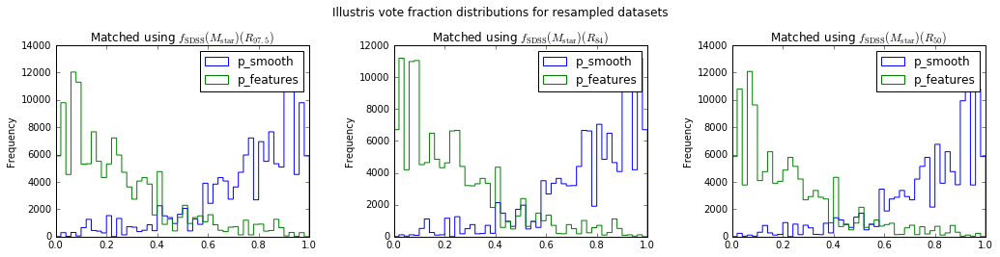

In [134]:
gc.collect()

bootstrapSmoothFeatureCompSloanIlustrisFigure = plt.figure(figsize=(15, 4))
plt.suptitle('Illustris vote fraction distributions for resampled datasets', size=12)
for index, dataset in enumerate([(bootstrapPdf97p5IllustrisFrameWithVotes[bootstrapPdf97p5IllustrisFrameWithVotes['priority'] == gzSampleSubsetForVoteFrac], 97.5), 
                                 (bootstrapPdf84IllustrisFrameWithVotes[bootstrapPdf84IllustrisFrameWithVotes['priority'] == gzSampleSubsetForVoteFrac], 84), 
                                 (bootstrapPdf50IllustrisFrameWithVotes[bootstrapPdf50IllustrisFrameWithVotes['priority'] == gzSampleSubsetForVoteFrac], 50)]) :
    subplotAxis = plt.subplot(1,3,index+1)
    dataset[0][['p_smooth','p_features']].plot.hist(ax=subplotAxis, bins=50, histtype='step', logy=False, fill=False, title='Matched using ' + r'$f_{\rm SDSS}(M_{\rm star}) (R_{' + str(dataset[1]) + r'})$')
plt.tight_layout(pad=3)

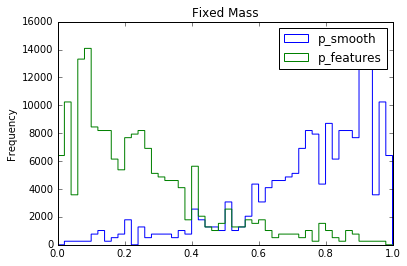

In [135]:
fixedMassVoteFracFig = plt.figure(figsize=(15, 15))
plt.suptitle('Illustris vote fraction distributions for resampled datasets', size=12)
for index, dataset in enumerate([(finalIllustris1RedshiftZeroSubHaloDataFramesWithVotes['fixed_mass'])]) :
    dataset[['p_smooth','p_features']].plot.hist(bins=50, histtype='step', logy=False, fill=False, title='Fixed Mass')

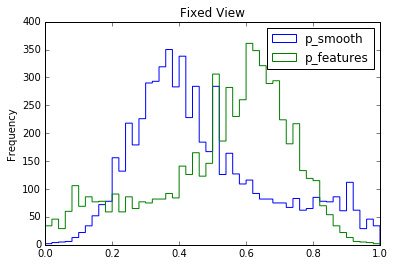

In [136]:
fixedViewVoteFracFig = plt.figure(figsize=(15, 15))
plt.suptitle('Illustris vote fraction distributions for resampled datasets', size=12)
for index, dataset in enumerate([(finalIllustris1RedshiftZeroSubHaloDataFramesWithVotes['fixed_view'])]) :
    dataset[['p_smooth','p_features']].plot.hist(bins=50, histtype='step', logy=False, fill=False, title='Fixed View')

**TODO**: Test Different backgrounds

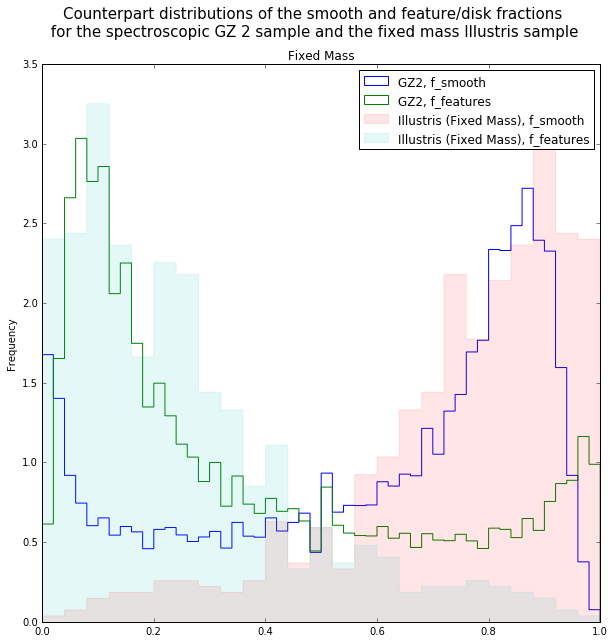

In [162]:
sdssSmoothFeatureVoteFracFigure = plt.figure(figsize=(10,10))
sdssResult[['t01_smooth_or_features_a01_smooth_fraction', 't01_smooth_or_features_a02_features_or_disk_fraction']].plot.hist(ax=sdssSmoothFeatureVoteFracFigure.gca(),bins=50, histtype='step', logy=False, fill=False, title='SDSS Vote Fraction Distribution', normed=True)
finalIllustris1RedshiftZeroSubHaloDataFramesWithVotes['fixed_mass'][['p_smooth','p_features']].plot.hist(ax=sdssSmoothFeatureVoteFracFigure.gca(),bins=25, histtype='step', logy=False, fill=True, alpha=0.1, title='Fixed Mass', normed=True)

lines, labels = sdssSmoothFeatureVoteFracFigure.gca().get_legend_handles_labels()
labels = ['GZ2, f_smooth','GZ2, f_features', r'Illustris (Fixed Mass), f_smooth', r'Illustris (Fixed Mass), f_features']
sdssSmoothFeatureVoteFracFigure.gca().legend(lines[:4], labels[:4], loc='best')

sdssSmoothFeatureVoteFracFigure.suptitle('Counterpart distributions of the smooth and feature/disk fractions\n for the spectroscopic GZ 2 sample and the fixed mass Illustris sample', size=15)



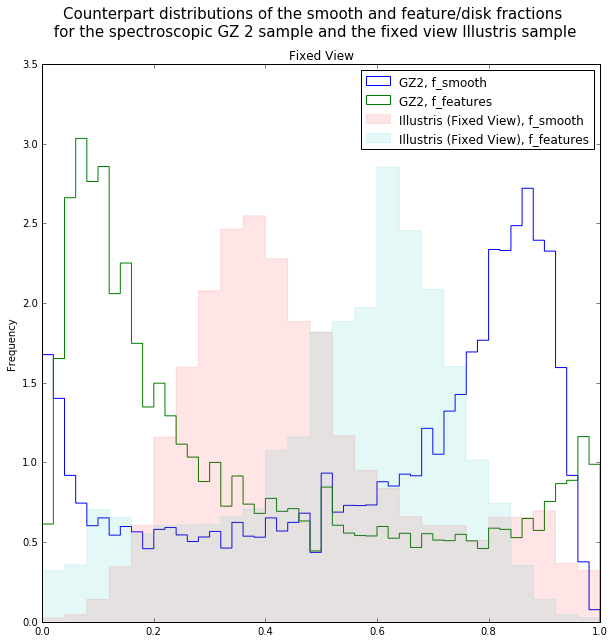

In [163]:
sdssSmoothFeatureVoteFracFigure = plt.figure(figsize=(10,10))
sdssResult[['t01_smooth_or_features_a01_smooth_fraction', 't01_smooth_or_features_a02_features_or_disk_fraction']].plot.hist(ax=sdssSmoothFeatureVoteFracFigure.gca(),bins=50, histtype='step', logy=False, fill=False, title='SDSS Vote Fraction Distribution', normed=True)
finalIllustris1RedshiftZeroSubHaloDataFramesWithVotes['fixed_view'][['p_smooth','p_features']].plot.hist(ax=sdssSmoothFeatureVoteFracFigure.gca(),bins=25, histtype='step', logy=False, fill=True, alpha=0.1, title='Fixed View', normed=True)

lines, labels = sdssSmoothFeatureVoteFracFigure.gca().get_legend_handles_labels()
labels = ['GZ2, f_smooth','GZ2, f_features', r'Illustris (Fixed View), f_smooth', r'Illustris (Fixed View), f_features']
sdssSmoothFeatureVoteFracFigure.gca().legend(lines[:4], labels[:4], loc='best')

sdssSmoothFeatureVoteFracFigure.suptitle('Counterpart distributions of the smooth and feature/disk fractions\n for the spectroscopic GZ 2 sample and the fixed view Illustris sample', size=15)

## Compare distributions of absolute magnitude for mass-matched SDSS and Illustris samples
There are two columns provided by the illustris collaboration that may refer to absolute magnitude: `absmag_*` and `stellarphotometrics_*` where `*` $\in$ [u,g,r,i,z] represents the SDSS apectral band. In fact, it seems like counterpart columns contain identical data. Unfortunately, neither match the SDSS distributions!

The [SDSS CasJobs database](http://skyserver.sdss.org/dr13/en/help/browser/browser.aspx#&&history=description+SpecPhoto+V) provides many variants of observed magnitudes. The subsequently plotted data are derived from the `petroMag_*` columns (where as above `*` $\in$ [u,g,r,i,z] represents the SDSS spectral band) and converted to absolute magnitude using the CasJobs database function [fCosmoAbsMag()](http://skyserver.sdss.org/dr13/en/help/browser/browser.aspx#&&history=description+fCosmoAbsMag+F). The conversion is currently done using the default cosmological values, which are derived from WMAP-5 data. 

**These are slightly different from those used by [Illustris](http://www.illustris-project.org/data/downloads/Illustris-1/) in their simulation, which are derived from WMAP-9**.

Begin by defining the *apparent* Petrosian magnitudes for the SDSS survey in each band $\in$ [u,g,r,i,z].

In [151]:
apparentMagLimits = {'u':22,
                     'g':22.2,
                     'r':17.77,
                     'i':21.3,
                     'z':20.5}

The `absmag_` column is plotted first.

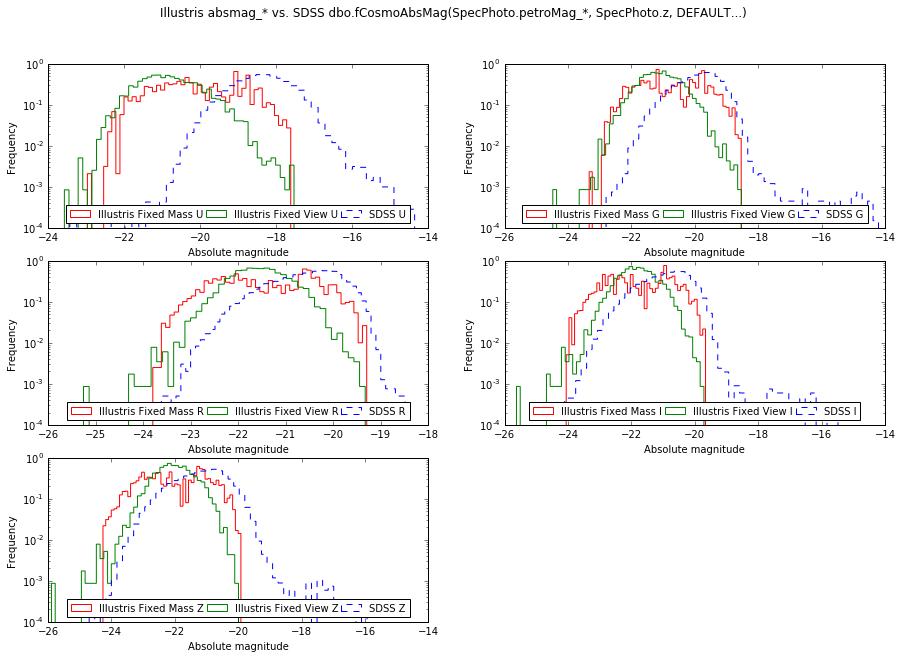

In [170]:
gc.collect()

bootstrapMagCompSloanIlustrisFigure = plt.figure(figsize=(15, 10))
bootstrapMagCompSloanIlustrisFigure.suptitle('Illustris absmag_* vs. SDSS dbo.fCosmoAbsMag(SpecPhoto.petroMag_*, SpecPhoto.z, DEFAULT...)', size=12)

for index, value in enumerate(['u','g','r','i','z']) :
    subplotAxis = plt.subplot(3, 2, index+1)
    if gzSampleSubset == 'full' :
        bootstrapPdf97p5IllustrisFrameWithVotes[bootstrapPdf97p5IllustrisFrameWithVotes['priority'] == 'fixed_mass'][['absmag_' + value]].plot.hist(ax=subplotAxis, normed=True,bins=50, histtype='step', logy=True, fill=False, color='r')
        bootstrapPdf97p5IllustrisFrameWithVotes[bootstrapPdf97p5IllustrisFrameWithVotes['priority'] == 'fixed_view'][['absmag_' + value]].plot.hist(ax=subplotAxis, normed=True,bins=50, histtype='step', logy=True, fill=False, color='g')
    else :
        bootstrapPdf97p5IllustrisFrameWithVotes[['absmag_' + value]].plot.hist(ax=subplotAxis, normed=True,bins=50, histtype='step', logy=True, fill=False, color='r')
    sdssResult[np.logical_and(sdssResult['absPetroMag_r'] > -9000, sdssResult['petroMag_' + value] < apparentMagLimits[value])][['absPetroMag_' + value]].plot.hist(linestyle='dashed',normed=True, ax=subplotAxis, bins=50, histtype='step', logy=True, fill=False, label='SDSS ' + value.upper(), color='b')
    lines, labels = subplotAxis.get_legend_handles_labels()
    if gzSampleSubset == 'full' : 
        labels = ['Illustris Fixed Mass ' + str(value.upper()), 'Illustris Fixed View ' + str(value.upper()), 'SDSS ' + str(value.upper())]
        subplotAxis.legend(lines[:3], labels[:3], loc='lower center', ncol=3, columnspacing=0.3, fontsize='medium')
    else :
        labels = ['Illustris ' + str(value.upper()), 'SDSS ' + str(value.upper())]
        subplotAxis.legend(lines[:2], labels[:2], loc='lower center', ncol=3, columnspacing=0.3, fontsize='medium')
    plt.xlabel("Absolute magnitude")

Now plot the `stellarphotometrics_*` columns.

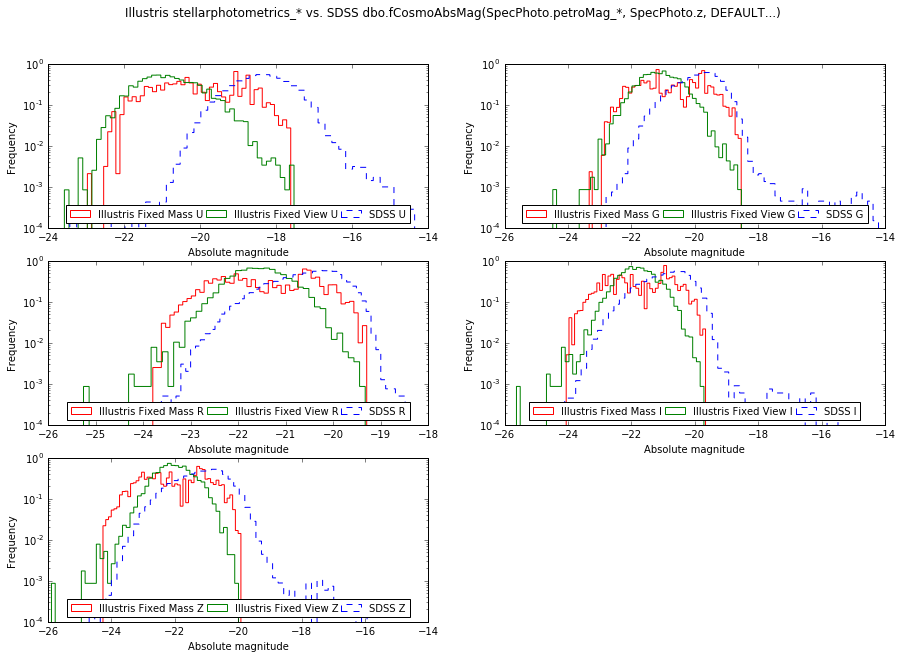

In [171]:
gc.collect()

bootstrapMagCompSloanIlustrisFigure = plt.figure(figsize=(15, 10))
bootstrapMagCompSloanIlustrisFigure.suptitle('Illustris stellarphotometrics_* vs. SDSS dbo.fCosmoAbsMag(SpecPhoto.petroMag_*, SpecPhoto.z, DEFAULT...)', size=12)

for index, value in enumerate(['u','g','r','i','z']) :
    subplotAxis = plt.subplot(3, 2, index+1)
    if gzSampleSubset == 'full' :
        bootstrapPdf97p5IllustrisFrameWithVotes[bootstrapPdf97p5IllustrisFrameWithVotes['priority'] == 'fixed_mass'][['stellarphotometrics_' + value]].plot.hist(ax=subplotAxis, normed=True,bins=50, histtype='step', logy=True, fill=False, color='r')
        bootstrapPdf97p5IllustrisFrameWithVotes[bootstrapPdf97p5IllustrisFrameWithVotes['priority'] == 'fixed_view'][['stellarphotometrics_' + value]].plot.hist(ax=subplotAxis, normed=True,bins=50, histtype='step', logy=True, fill=False, color='g')
    else :
        bootstrapPdf97p5IllustrisFrameWithVotes[['stellarphotometrics_' + value]].plot.hist(ax=subplotAxis, normed=True,bins=50, histtype='step', logy=True, fill=False, color='r')
    sdssResult[np.logical_and(sdssResult['absPetroMag_r'] > -9000, sdssResult['petroMag_' + value] < apparentMagLimits[value])][['absPetroMag_' + value]].plot.hist(linestyle='dashed',normed=True, ax=subplotAxis, bins=50, histtype='step', logy=True, fill=False, label='SDSS ' + value.upper())
    lines, labels = subplotAxis.get_legend_handles_labels()
    if gzSampleSubset == 'full' : 
        labels = ['Illustris Fixed Mass ' + str(value.upper()), 'Illustris Fixed View ' + str(value.upper()), 'SDSS ' + str(value.upper())]
        subplotAxis.legend(lines[:3], labels[:3], loc='lower center', ncol=3, columnspacing=0.3, fontsize='medium')
    else :
        labels = ['Illustris ' + str(value.upper()), 'SDSS ' + str(value.upper())]
        subplotAxis.legend(lines[:2], labels[:2], loc='lower center', ncol=3, columnspacing=0.3, fontsize='medium')
    plt.xlabel("Absolute magnitude")

## Now compare bivariate distributions
**Initially** plot the absolute magnitude verus the logarithm of the stellar mass. Recall that the stellar mass distributions are matched, so the SDSS data are implicitly cut at $\log(M_{\rm stellar}) = 10$.

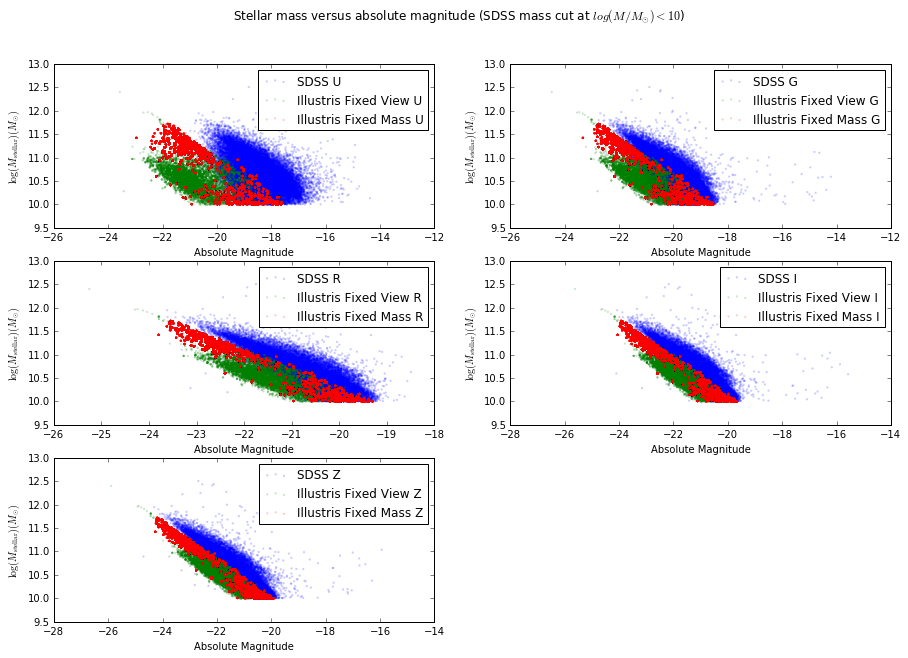

In [203]:
gc.collect()

bootstrapMagVMassCompSloanIlustrisFigure = plt.figure(figsize=(15, 10))
bootstrapMagVMassCompSloanIlustrisFigure.suptitle(r'Stellar mass versus absolute magnitude (SDSS mass cut at $log(M/M_{\odot}) < 10$)', size=12)

bootstrapPdf97p5IllustrisFrameWithVotes['logStellarMass'] = pd.Series(np.log10(10**10*bootstrapPdf97p5IllustrisFrameWithVotes["mass_stars"]/hubbleH), index=bootstrapPdf97p5IllustrisFrameWithVotes.index)

for index, value in enumerate(['u','g','r','i','z']) :
    subplotAxis = plt.subplot(3, 2, index+1)
    sdssResult[np.logical_and(np.logical_and(sdssResult['absPetroMag_r'] > -9000, sdssResult['lgm_tot_p97p5'] > 10), sdssResult['petroMag_' + value] < apparentMagLimits[value])][['absPetroMag_' + value, 'lgm_tot_p97p5']].plot.scatter(x='absPetroMag_' + value, y='lgm_tot_p97p5', label='SDSS ' + value.upper(), ax=subplotAxis, alpha=1, marker='.', color='b', edgecolors='None', legend=True)
    if gzSampleSubset == 'full' :
        subselection = bootstrapPdf97p5IllustrisFrameWithVotes[bootstrapPdf97p5IllustrisFrameWithVotes['priority'] == 'fixed_view']
        subselection[['absmag_' + value, 'logStellarMass']].plot.scatter(x='absmag_' + value, y='logStellarMass',ax=subplotAxis, alpha=1, marker='.', edgecolors='None', color='g', label='Illustris Fixed View ' + value.upper())
        subselection = bootstrapPdf97p5IllustrisFrameWithVotes[bootstrapPdf97p5IllustrisFrameWithVotes['priority'] == 'fixed_mass']
        subselection[['absmag_' + value, 'logStellarMass']].plot.scatter(x='absmag_' + value, y='logStellarMass',ax=subplotAxis, alpha=1, marker='.', edgecolors='None', color='r', label='Illustris Fixed Mass ' + value.upper())
    else :
        subselection = bootstrapPdf97p5IllustrisFrameWithVotes[bootstrapPdf97p5IllustrisFrameWithVotes['priority'] == 'fixed_view']
        subselection[['absmag_' + value, 'logStellarMass']].plot.scatter(x='absmag_' + value, y='logStellarMass',ax=subplotAxis, alpha=1, marker='.', edgecolors='None', color='r', label='Illustris ' + gzSampleSubset + ' ' + value.upper())

    plt.ylabel(r'$\log(M_{\rm stellar}) (M_{\odot})$')    
    plt.xlabel(r'Absolute Magnitude')

## Convert absolute magnitude to luminosity
Now use $L=L_{\odot}\cdot10^{(\frac{M_{\odot} - M_{\rm galaxy}}{2.5})}$ to convert from absolute magnitude to luminosity with $M_{\odot}=-4.77$ representing the absolute magnitude of the sun and $L_{\odot}=3.9\times10^{33}\;{\rm erg\;s^{-1}}$ the solar luminosity.

The **three** outlying SDDS data with absolute magnitudes less than the minimum absolute magnitude of any sample in the illustris dataset are cut to achieve axes that better reveal the differences in distribution between the bulk of the data.

As before, there is an implicit cut at $\log_{10}(M_{\rm stellar}) = 10$.

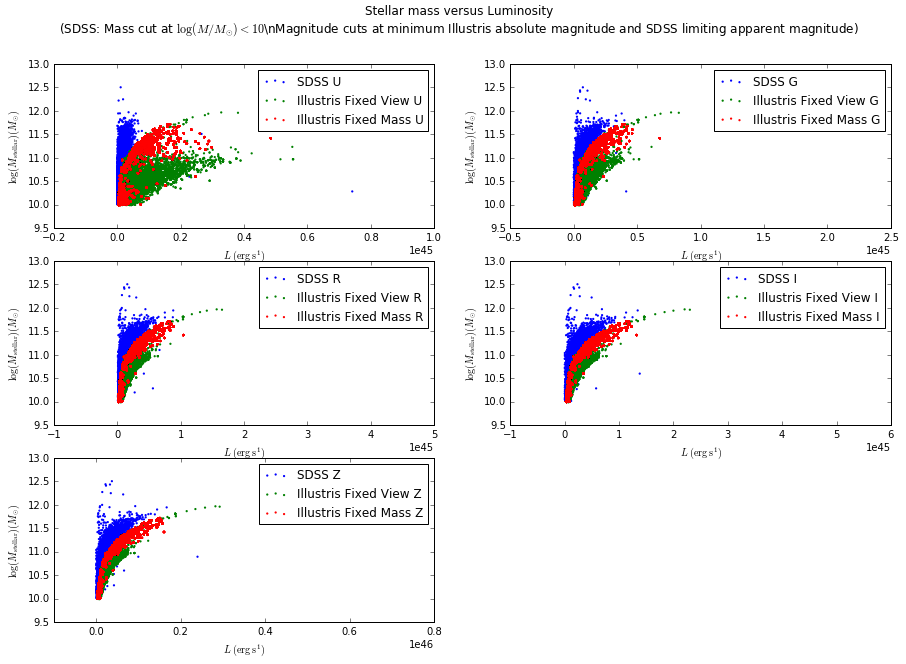

In [206]:
gc.collect()

bootstrapMagVMassCompSloanIlustrisFigure = plt.figure(figsize=(15, 10))
bootstrapMagVMassCompSloanIlustrisFigure.suptitle('Stellar mass versus Luminosity\n' + r'(SDSS: Mass cut at $\log(M/M_{\odot}) < 10$\nMagnitude cuts at minimum Illustris absolute magnitude and SDSS limiting apparent magnitude)', size=12)

bootstrapPdf97p5IllustrisFrameWithVotes['logStellarMass'] = pd.Series(np.log10(10**10*bootstrapPdf97p5IllustrisFrameWithVotes["mass_stars"]/hubbleH), index=bootstrapPdf97p5IllustrisFrameWithVotes.index)

solarLuminosity = 3.9e33 # erg s^{-1}
solarAbsMag = 4.77

for index, value in enumerate(['u','g','r','i','z']) :
    bootstrapPdf97p5IllustrisFrameWithVotes['lum_from_absmag_' + value] = pd.Series(solarLuminosity*(10**((solarAbsMag - bootstrapPdf97p5IllustrisFrameWithVotes['absmag_' + value])/2.5)), index=bootstrapPdf97p5IllustrisFrameWithVotes.index)
    sdssResult['lum_from_absPetroMag_' + value] = pd.Series(solarLuminosity*(10**((solarAbsMag - sdssResult['absPetroMag_' + value])/2.5)), index=sdssResult.index)
    
    minIllustrisAbsMag = bootstrapPdf97p5IllustrisFrameWithVotes['absmag_' + value].min()
    
    subplotAxis = plt.subplot(3, 2, index+1)
    sdssResult[np.logical_and(
        np.logical_and(sdssResult['absPetroMag_' + value] > minIllustrisAbsMag,
                       sdssResult['lgm_tot_p97p5'] > 10
                      ),
        sdssResult['petroMag_' + value] < apparentMagLimits[value]
    )][['lum_from_absPetroMag_' + value, 'lgm_tot_p97p5']].plot.scatter(x='lum_from_absPetroMag_' + value, y='lgm_tot_p97p5', label='SDSS ' + value.upper(), ax=subplotAxis, alpha=1, marker='.', edgecolors='None', color='b', legend=True)
    
    if gzSampleSubset == 'full' :
        bootstrapPdf97p5IllustrisFrameWithVotes[bootstrapPdf97p5IllustrisFrameWithVotes['priority'] == 'fixed_view'][['lum_from_absmag_' + value, 'logStellarMass']].plot.scatter(x='lum_from_absmag_' + value, y='logStellarMass',ax=subplotAxis, alpha=1, marker='.', edgecolors='None', color='g', label='Illustris Fixed View ' + value.upper())
        bootstrapPdf97p5IllustrisFrameWithVotes[bootstrapPdf97p5IllustrisFrameWithVotes['priority'] == 'fixed_mass'][['lum_from_absmag_' + value, 'logStellarMass']].plot.scatter(x='lum_from_absmag_' + value, y='logStellarMass',ax=subplotAxis, alpha=1, marker='.', edgecolors='None', color='r', label='Illustris Fixed Mass ' + value.upper())
    else :
        bootstrapPdf97p5IllustrisFrameWithVotes[['lum_from_absmag_' + value, 'logStellarMass']].plot.scatter(x='lum_from_absmag_' + value, y='logStellarMass',ax=subplotAxis, alpha=1, marker='.', edgecolors='None', color='r', label='Illustris ' + gzSampleSubset + ' ' + value.upper())
    
    plt.ylabel(r'$\log(M_{\rm stellar}) (M_{\odot})$')    
    plt.xlabel(r'$L\;({\rm erg\;s^{1}})$')

## Distributions of the $L/M_{\rm stellar}$ ratio for the mass-matched Illustris and SDSS samples.
The SDSS data selection mirror the previous set of plots.

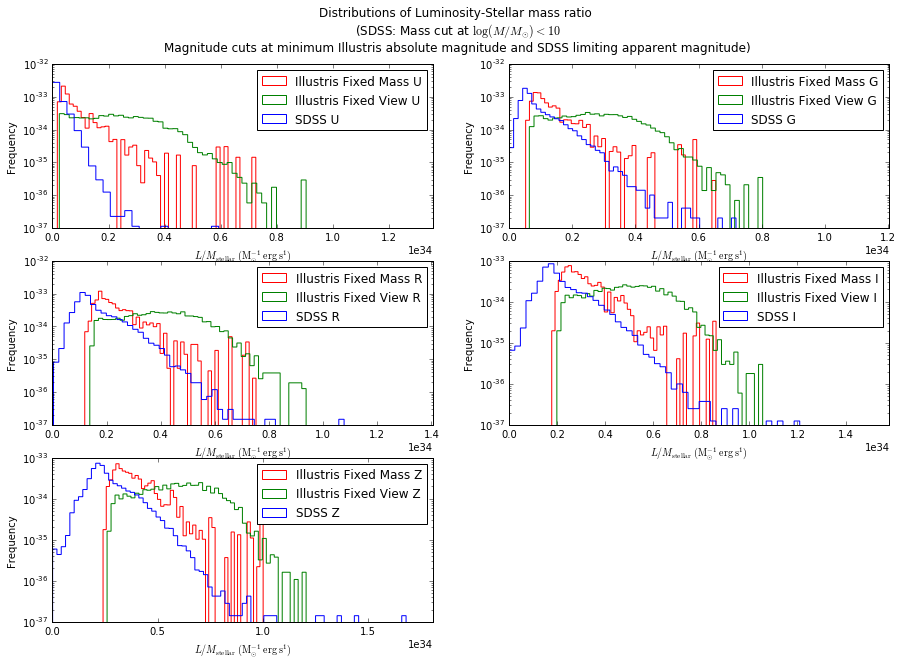

In [207]:
gc.collect()

bootstrapMagOverMassCompSloanIlustrisFigure = plt.figure(figsize=(15, 10))
bootstrapMagOverMassCompSloanIlustrisFigure.suptitle('Distributions of Luminosity-Stellar mass ratio \n(SDSS: Mass cut at $\log(M/M_{\odot}) < 10$\nMagnitude cuts at minimum Illustris absolute magnitude and SDSS limiting apparent magnitude)', size=12)

bootstrapPdf97p5IllustrisFrameWithVotes['logStellarMass'] = pd.Series(np.log10(10**10*bootstrapPdf97p5IllustrisFrameWithVotes["mass_stars"]/hubbleH), index=bootstrapPdf97p5IllustrisFrameWithVotes.index)

solarLuminosity = 3.9e33 # erg s^{-1}

for index, value in enumerate(['u','g','r','i','z']) :    
    subplotAxis = plt.subplot(3, 2, index+1)
    bootstrapFrameSubset = None
    maxIllustrisValue = None
    if gzSampleSubset == 'full' :
        bootstrapFrameSubset = bootstrapPdf97p5IllustrisFrameWithVotes[bootstrapPdf97p5IllustrisFrameWithVotes['priority'] == 'fixed_mass'][['lum_from_absmag_' + value, 'logStellarMass']]
        (bootstrapFrameSubset['lum_from_absmag_' + value]/(10**bootstrapFrameSubset['logStellarMass'])).plot.hist(ax=subplotAxis, bins=50, histtype='step', logy=True, fill=False, color='r', normed=True)
        maxIllustrisValue = (bootstrapFrameSubset['lum_from_absmag_' + value]/(10**bootstrapFrameSubset['logStellarMass'])).max()
        bootstrapFrameSubset = bootstrapPdf97p5IllustrisFrameWithVotes[bootstrapPdf97p5IllustrisFrameWithVotes['priority'] == 'fixed_view'][['lum_from_absmag_' + value, 'logStellarMass']]
        (bootstrapFrameSubset['lum_from_absmag_' + value]/(10**bootstrapFrameSubset['logStellarMass'])).plot.hist(ax=subplotAxis, bins=50, histtype='step', logy=True, fill=False, color='g', normed=True)
        maxIllustrisValue = max(maxIllustrisValue, (bootstrapFrameSubset['lum_from_absmag_' + value]/(10**bootstrapFrameSubset['logStellarMass'])).max())
    else :
        bootstrapFrameSubset = bootstrapPdf97p5IllustrisFrameWithVotes[['lum_from_absmag_' + value, 'logStellarMass']]
        (bootstrapFrameSubset['lum_from_absmag_' + value]/(10**bootstrapFrameSubset['logStellarMass'])).plot.hist(ax=subplotAxis, bins=50, histtype='step', logy=True, fill=False, color='r', normed=True)
        maxIllustrisValue = (bootstrapFrameSubset['lum_from_absmag_' + value]/(10**bootstrapFrameSubset['logStellarMass'])).max()
    
    sdssResultSubset = sdssResult[np.logical_and(
                np.logical_and(sdssResult['absPetroMag_' + value] > minIllustrisAbsMag,
                               sdssResult['lgm_tot_p97p5'] > 10
                              ),
                sdssResult['petroMag_' + value] < apparentMagLimits[value]
            )][['lum_from_absPetroMag_' + value, 'lgm_tot_p97p5']]
        
    (sdssResultSubset['lum_from_absPetroMag_' + value]/(10**sdssResultSubset['lgm_tot_p97p5'])).plot.hist(ax=subplotAxis, bins=150, histtype='step', logy=True, fill=False, color='b', normed=True)
    plt.xlabel(r'$L/M_{\rm stellar}\;({\rm M_{\odot}^{-1}\;erg\;s^{1}})$')
    plt.xlim(0, 1.5*maxIllustrisValue)
    lines, labels = subplotAxis.get_legend_handles_labels()
    if gzSampleSubset == 'full' : 
        labels = ['Illustris Fixed Mass ' + str(value.upper()), 'Illustris Fixed View ' + str(value.upper()), 'SDSS ' + str(value.upper())]
        subplotAxis.legend(lines[:3], labels[:3], loc='best')
    else :
        labels = ['Illustris ' + str(value.upper()), 'SDSS ' + str(value.upper())]
        subplotAxis.legend(lines[:2], labels[:2], loc='best')

## Generate distributions for subsets of data classified as *edge on* or *not edge on* 

### Begin by computing columns for the SDSS data that are equivalent to the Illustris `edge_on*` cases

In [211]:
sdssResult['is_edge_on'] = sdssResult['t02_edgeon_a04_yes_count'] > sdssResult['t02_edgeon_a05_no_count']
sdssResult['is_features_and_edge_on'] = np.logical_and(sdssResult['t01_smooth_or_features_a02_features_or_disk_fraction'] > 0.6, sdssResult['is_edge_on'])  
prettyPrinter.pprint(sdssResult.columns.values)

array(['z', 'zErr', 'zWarning', 'petroMag_u', 'petroMag_g', 'petroMag_r',
       'petroMag_i', 'petroMag_z', 'absPetroMag_u', 'absPetroMag_g',
       'absPetroMag_r', 'absPetroMag_i', 'absPetroMag_z', 'dec',
       'decstring', 'dr7objid', 'dr8objid', 'ra', 'rastring', 'sample',
       't01_smooth_or_features_a01_smooth_count',
       't01_smooth_or_features_a01_smooth_debiased',
       't01_smooth_or_features_a01_smooth_flag',
       't01_smooth_or_features_a01_smooth_fraction',
       't01_smooth_or_features_a01_smooth_weight',
       't01_smooth_or_features_a01_smooth_weighted_fraction',
       't01_smooth_or_features_a02_features_or_disk_count',
       't01_smooth_or_features_a02_features_or_disk_debiased',
       't01_smooth_or_features_a02_features_or_disk_flag',
       't01_smooth_or_features_a02_features_or_disk_fraction',
       't01_smooth_or_features_a02_features_or_disk_weight',
       't01_smooth_or_features_a02_features_or_disk_weighted_fraction',
       't01_smooth_or_fe

### First plot the absolute magnitude distributions for *edge on* galaxies

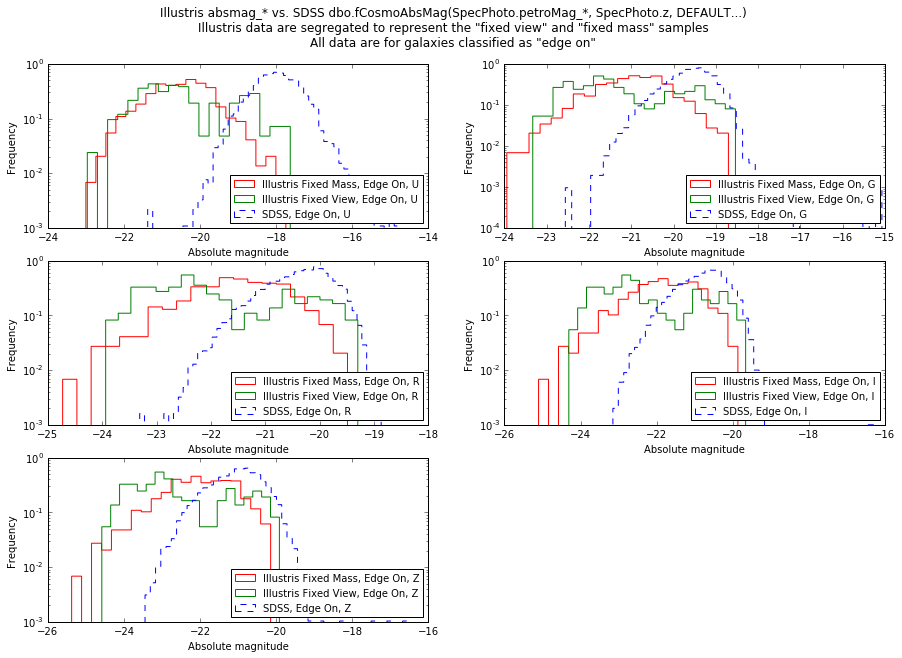

In [217]:
gc.collect()

preCutDataFrame = finalIllustris1RedshiftZeroSubHaloDataFrames["full"]
#bootstrapPdf97p5IllustrisFrameWithVotes

bootstrapMagCompSloanIlustrisFigure = plt.figure(figsize=(15, 10))
bootstrapMagCompSloanIlustrisFigure.suptitle('Illustris absmag_* vs. SDSS dbo.fCosmoAbsMag(SpecPhoto.petroMag_*, SpecPhoto.z, DEFAULT...)\nIllustris data are segregated to represent the "fixed view" and "fixed mass" samples\nAll data are for galaxies classified as "edge on"', size=12)

for index, value in enumerate(['u','g','r','i','z']) :
    subplotAxis = plt.subplot(3, 2, index+1)
    if gzSampleSubset == 'full' :
        preCutDataFrame[np.logical_and(preCutDataFrame['priority'] == 'fixed_view', preCutDataFrame['is_edge_on'])][['absmag_' + value]].plot.hist(ax=subplotAxis, normed=True,bins=20, histtype='step', logy=True, fill=False, color='r')
        preCutDataFrame[np.logical_and(preCutDataFrame['priority'] == 'fixed_mass', preCutDataFrame['is_edge_on'])][['absmag_' + value]].plot.hist(ax=subplotAxis, normed=True,bins=20, histtype='step', logy=True, fill=False, color='g')
    else :
        preCutDataFrame[preCutDataFrame['is_edge_on']][['absmag_' + value]].plot.hist(ax=subplotAxis, normed=True,bins=50, histtype='step', logy=True, fill=False, color='r')
    sdssResult[np.logical_and(sdssResult['is_edge_on'], np.logical_and(sdssResult['absPetroMag_r'] > -9000, sdssResult['petroMag_' + value] < apparentMagLimits[value]))][['absPetroMag_' + value]].plot.hist(linestyle='dashed',normed=True, ax=subplotAxis, bins=50, histtype='step', logy=True, fill=False, label='SDSS ' + value.upper(), color='b')
    lines, labels = subplotAxis.get_legend_handles_labels()
    if gzSampleSubset == 'full' : 
        labels = ['Illustris Fixed Mass, Edge On, ' + str(value.upper()), 'Illustris Fixed View, Edge On, ' + str(value.upper()), 'SDSS, Edge On, ' + str(value.upper())]
        subplotAxis.legend(lines[:3], labels[:3], loc='lower right', fontsize='medium')
    else :
        labels = ['Illustris ' + str(value.upper()), 'SDSS, Edge On, ' + str(value.upper())]
        subplotAxis.legend(lines[:2], labels[:2], loc='lower right', fontsize='medium')
    plt.xlabel("Absolute magnitude")

### Second First plot the absolute magnitude distributions for *NOT edge on* galaxies

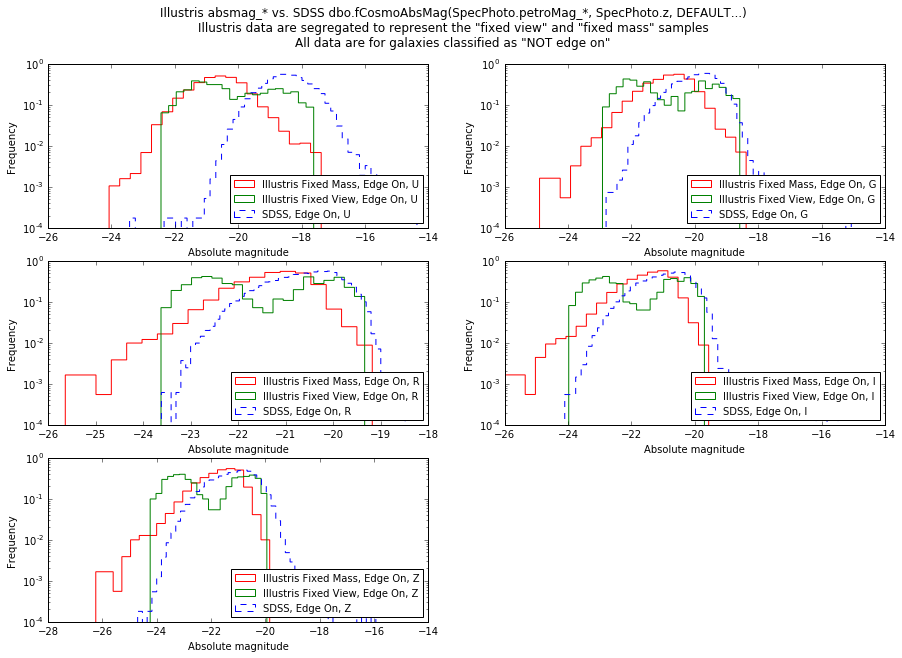

In [219]:
gc.collect()

preCutDataFrame = finalIllustris1RedshiftZeroSubHaloDataFrames["full"]
#bootstrapPdf97p5IllustrisFrameWithVotes

bootstrapMagCompSloanIlustrisFigure = plt.figure(figsize=(15, 10))
bootstrapMagCompSloanIlustrisFigure.suptitle('Illustris absmag_* vs. SDSS dbo.fCosmoAbsMag(SpecPhoto.petroMag_*, SpecPhoto.z, DEFAULT...)\nIllustris data are segregated to represent the "fixed view" and "fixed mass" samples\nAll data are for galaxies classified as "NOT edge on"', size=12)

for index, value in enumerate(['u','g','r','i','z']) :
    subplotAxis = plt.subplot(3, 2, index+1)
    if gzSampleSubset == 'full' :
        preCutDataFrame[np.logical_and(preCutDataFrame['priority'] == 'fixed_view', np.logical_not(preCutDataFrame['is_edge_on']))][['absmag_' + value]].plot.hist(ax=subplotAxis, normed=True,bins=20, histtype='step', logy=True, fill=False, color='r')
        preCutDataFrame[np.logical_and(preCutDataFrame['priority'] == 'fixed_mass', np.logical_not(preCutDataFrame['is_edge_on']))][['absmag_' + value]].plot.hist(ax=subplotAxis, normed=True,bins=20, histtype='step', logy=True, fill=False, color='g')
    else :
        preCutDataFrame[np.logical_not(preCutDataFrame['is_edge_on'])][['absmag_' + value]].plot.hist(ax=subplotAxis, normed=True,bins=50, histtype='step', logy=True, fill=False, color='r')
    sdssResult[np.logical_and(np.logical_not(sdssResult['is_edge_on']), np.logical_and(sdssResult['absPetroMag_r'] > -9000, sdssResult['petroMag_' + value] < apparentMagLimits[value]))][['absPetroMag_' + value]].plot.hist(linestyle='dashed',normed=True, ax=subplotAxis, bins=50, histtype='step', logy=True, fill=False, label='SDSS ' + value.upper(), color='b')
    lines, labels = subplotAxis.get_legend_handles_labels()
    if gzSampleSubset == 'full' : 
        labels = ['Illustris Fixed Mass, Edge On, ' + str(value.upper()), 'Illustris Fixed View, Edge On, ' + str(value.upper()), 'SDSS, Edge On, ' + str(value.upper())]
        subplotAxis.legend(lines[:3], labels[:3], loc='lower right', fontsize='medium')
    else :
        labels = ['Illustris ' + str(value.upper()), 'SDSS, Edge On, ' + str(value.upper())]
        subplotAxis.legend(lines[:2], labels[:2], loc='lower right', fontsize='medium')
    plt.xlabel("Absolute magnitude")